In [22]:
import json

import interfere
import interfere_experiments as ie
from interfere_experiments.data_generators import *
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
import numpy as np


DATA_DIR = "/Users/djpassey/Google Drive/My Drive/Docs/PhD Research/DissertationColabs/InterfereBenchmark1.0.0/"

BENCHMARK_MODELS = [
    AttractingFixedPoint4D,
    Belozyorov1,
    Belozyorov2,
    Belozyorov3,
    
    CoupledLogisticMapAllToAll,
    CoupledLogisticMapTwoCycles,
    CoupledLogisticMapOneCycle,

    CoupledMapLatticeChaoticBrownian,

    CoupledMapLatticeDefectTurbulence,
    CoupledMapLatticePatternSelection,
    CoupledMapLatticeSpatioTempChaos,
    CoupledMapLatticeSpatioTempIntermit,


    ImaginaryRoots4D,
    
    KuramotoOscilator1,
    KuramotoOscilator2,
    KuramotoOscilator3,
    KuramotoOscilator4,
    
    KuramotoSakaguchi1,
    KuramotoSakaguchi2,
    KuramotoSakaguchi3,

    Liping3DQuadFinance1,
    Liping3DQuadFinance2,

    LotkaVoltera1,
    LotkaVoltera2,
    LotkaVoltera3,
    LotkaVoltera4,

    OrnsteinUhlenbeck1,
    OrnsteinUhlenbeck2,
    OrnsteinUhlenbeck3,

    VARMA1SpatiotempChaos,
    VARMA2ChaoticBrownian,
    VARMA3LotkaVoltera,
  
    LotkaVolteraConfound,
    LotkaVolteraMediator,
    LotkaVolteraBlockableConfound,
    CoupledLogisticMapConfound,
    CoupledLogisticMapBlockableConfound,
    WilsonCowanDownstream,
    WilsonCowanMultiConf,
    Lorenz1,
    Lorenz2,
    Rossler1,
    Rossler2,
    Thomas1,
    Thomas2,

    CoupledMapLatticeTravelingWave,
    CoupledMapLatticeChaoticTravelingWave,
]


COLORS = [str(v) for v in mcolors.TABLEAU_COLORS.values()]
plt.rcParams["figure.dpi"] = 150

TRAIN_OBS = 5000
FORECAST_OBS = 300
NUM_BURN_IN_STATES = 1000


In [3]:
def plot_helper(
    model_name: str,
    data: ie.control_vs_resp.ControlVsRespData,
    target_idx=None
):
    """Plots control vs Response Data"""

    dims = data.train_states.shape[1]
    all_states = np.vstack([
        data.train_states,
        data.forecast_states,
        data.interv_states,
    ])
    ymax = np.max(all_states)
    ymin = np.min(all_states)
    diff = ymax - ymin
    lims = (ymin - 0.1 * diff, ymax + 0.1 * diff)

    _, ax = plt.subplots(dims, 2, figsize=(7, 2 * dims))
    for i in range(dims):
        ax[i, 0].plot(
            data.train_t, data.train_states[:, i], alpha=0.7, c=COLORS[4])
        ax[i, 0].set_ylim(lims)

    for i in range(dims):
        ax[i, 1].plot(
            data.forecast_t, data.forecast_states[:, i], alpha=0.7, c=COLORS[0])
        if i == target_idx:
            ax[i, 1].plot(
            data.forecast_t, data.interv_states[:, i], alpha=0.7, lw=3, c=COLORS[6])
        else:
            ax[i, 1].plot(
                data.forecast_t, data.interv_states[:, i], alpha=0.7, c=COLORS[3])
        ax[i, 1].set_ylim(lims)

    ax[-1, -1].plot(
        data.forecast_t[:2], data.forecast_states[:2, -1], 
        alpha=0.7, c=COLORS[0], label="Forecast Test Data"
    )
    ax[-1, -1].plot(
        data.forecast_t[:2], data.interv_states[:2, -1], 
        alpha=0.7, c=COLORS[3], label="Intervention Test Data"
    )
    ax[-1, -1].plot(
        data.train_t[-2:], data.train_states[-2:, -1], 
        alpha=0.7, c=COLORS[4], label="Train Data"
    )

    plt.legend(loc=(0.2, -.5))
    plt.suptitle(model_name + "\nTraining Data (left) v.s. Forecast and Intervention Test Data (right)\n")
    plt.tight_layout()
    plt.show()

In [18]:
issubclass(interfere.dynamics.Belozyorov3DQuad, interfere.DynamicModel)

True

In [17]:
interfere.DynamicModel

interfere.base.DynamicModel

DATA GENERATOR NAME: 
	AttractingFixedPoint4D

MODEL_TYPE: 
	interfere.dynamics.attracting_fixed_point_4d_linear_sde

DOCUMENTATION FOR MODEL: 

Initializes a system with a stable attracting fixed point.

    The system has the form:

        dX = AX dt + Sigma dW

    Where dW is a 4D vector of independent brownian increments and

    A = np.array([
        [-1.10304862, -0.70089361, -0.45482057, -0.79479689],
        [-0.70089361, -1.30642756, -0.58810384, -0.90591161],
        [-0.45482057, -0.58810384, -0.30309825, -0.47258556],
        [-0.79479689, -0.90591161, -0.47258556, -0.89742557]
    ])

    Sigma = sigma * I

    All eigenvalues of A are negative and real.
        eigs = [-0.01, -3.0, -0.5, -0.1]

    Args:
        sigma (float): controls the magnitude of the brownian noise. 
        measurement_noise_std (ndarray): None, or a vector with shape (n,)
            where each entry corresponds to the standard deviation of the
            measurement noise for that particular 

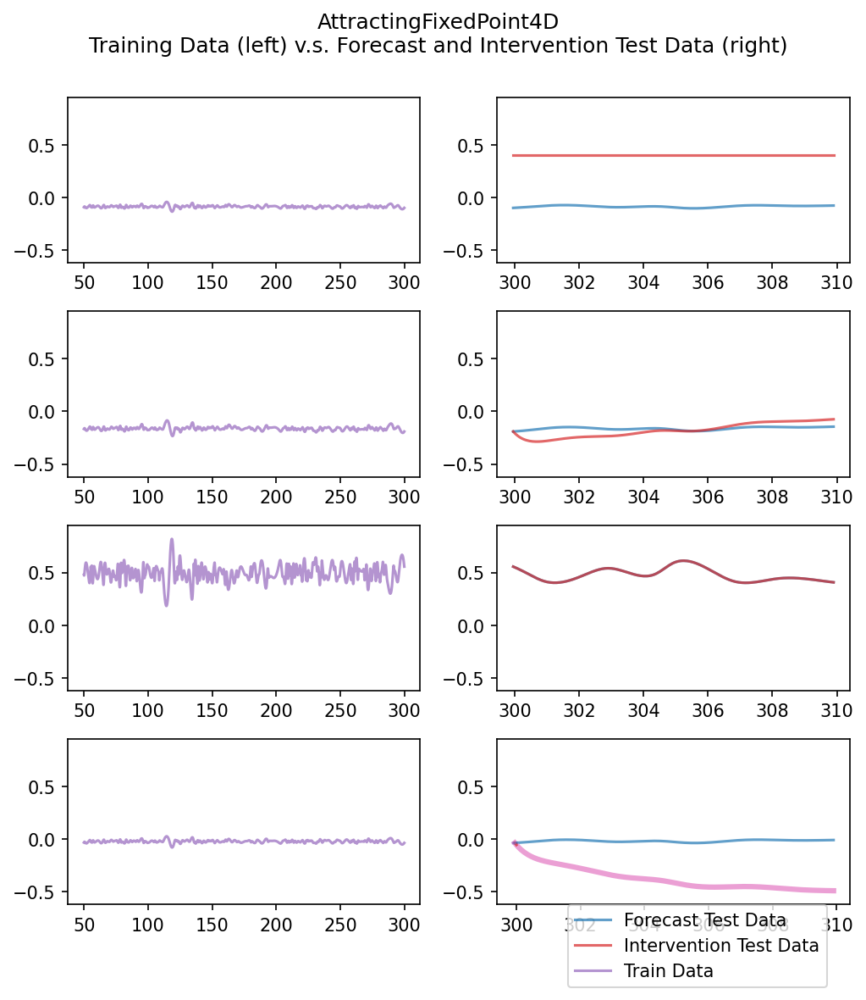

DATA GENERATOR NAME: 
	Belozyorov1

MODEL_TYPE: 
	interfere.dynamics.Belozyorov3DQuad

DOCUMENTATION FOR MODEL: 

Initializes a 3D quadratic SDE.

        dx/dt = -2x + 7y^2 + 13z^2 

        dy/dy = mu*x + 7y + 10z - 3xy

        dz/dt = -10y + 7z -3xz

        
        dX = dx/dt(x, y, z) * dt + sigma dW

        dY = dy/dt(x, y, z) * dt + sigma dW
        
        dZ = dz/dt(x, y, z) * dt + sigma dW

        
        Taken from 
            Belozyorov (2015). Exponential-Algebraic Maps and Chaos in 3D
            Autonomous Quadratic Systems. Equation (37).

        Args:
            mu (float): A parameter that can be tuned to generate chaotic
                behavior. Should be in [0, 2.27) and mu = 1.81 should lead
                to chaotic dynamics.
            sigma (float):  Coefficient on Weiner intervals.
            measurement_noise_std (ndarray): None, or a vector with shape (n,)
                where each entry corresponds to the standard deviation of the
              

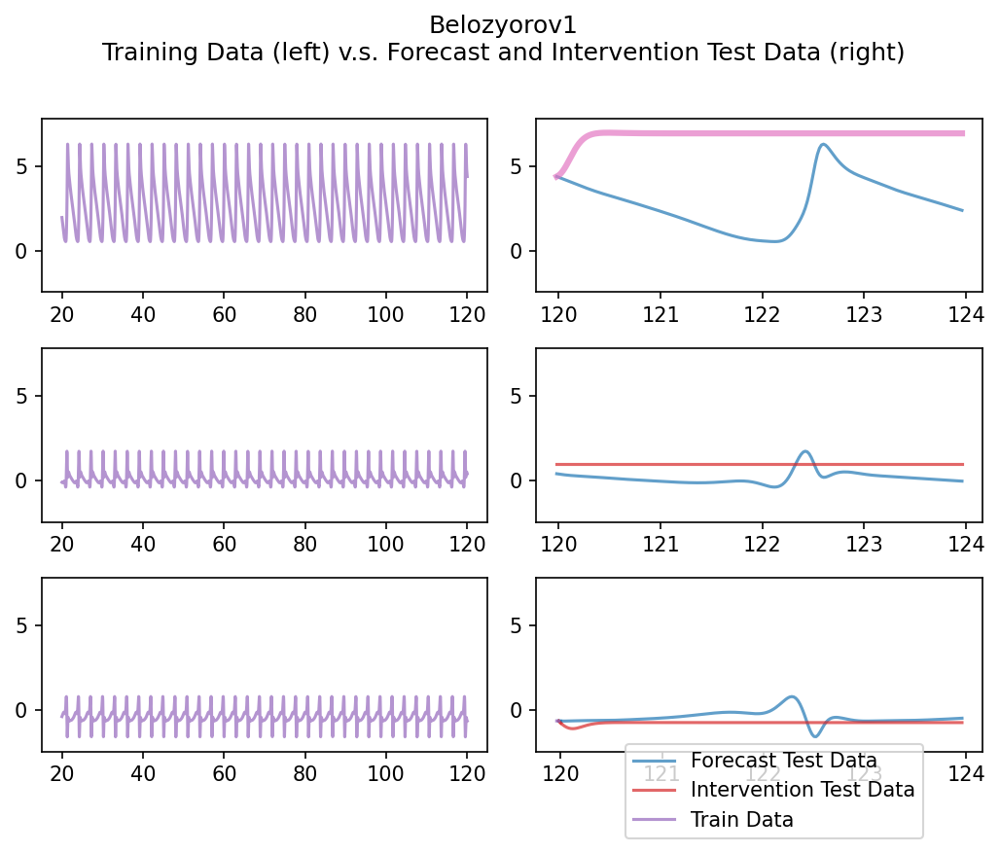

DATA GENERATOR NAME: 
	Belozyorov2

MODEL_TYPE: 
	interfere.dynamics.Belozyorov3DQuad

DOCUMENTATION FOR MODEL: 

Initializes a 3D quadratic SDE.

        dx/dt = -2x + 7y^2 + 13z^2 

        dy/dy = mu*x + 7y + 10z - 3xy

        dz/dt = -10y + 7z -3xz

        
        dX = dx/dt(x, y, z) * dt + sigma dW

        dY = dy/dt(x, y, z) * dt + sigma dW
        
        dZ = dz/dt(x, y, z) * dt + sigma dW

        
        Taken from 
            Belozyorov (2015). Exponential-Algebraic Maps and Chaos in 3D
            Autonomous Quadratic Systems. Equation (37).

        Args:
            mu (float): A parameter that can be tuned to generate chaotic
                behavior. Should be in [0, 2.27) and mu = 1.81 should lead
                to chaotic dynamics.
            sigma (float):  Coefficient on Weiner intervals.
            measurement_noise_std (ndarray): None, or a vector with shape (n,)
                where each entry corresponds to the standard deviation of the
              

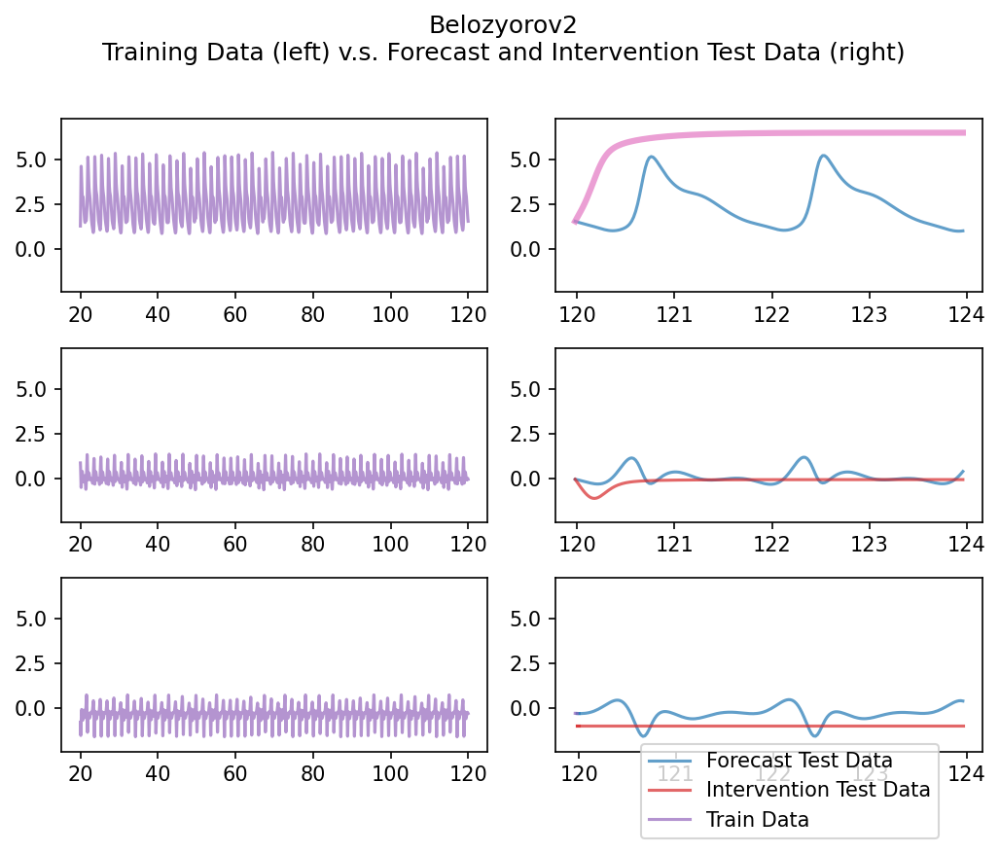

DATA GENERATOR NAME: 
	Belozyorov3

MODEL_TYPE: 
	interfere.dynamics.Belozyorov3DQuad

DOCUMENTATION FOR MODEL: 

Initializes a 3D quadratic SDE.

        dx/dt = -2x + 7y^2 + 13z^2 

        dy/dy = mu*x + 7y + 10z - 3xy

        dz/dt = -10y + 7z -3xz

        
        dX = dx/dt(x, y, z) * dt + sigma dW

        dY = dy/dt(x, y, z) * dt + sigma dW
        
        dZ = dz/dt(x, y, z) * dt + sigma dW

        
        Taken from 
            Belozyorov (2015). Exponential-Algebraic Maps and Chaos in 3D
            Autonomous Quadratic Systems. Equation (37).

        Args:
            mu (float): A parameter that can be tuned to generate chaotic
                behavior. Should be in [0, 2.27) and mu = 1.81 should lead
                to chaotic dynamics.
            sigma (float):  Coefficient on Weiner intervals.
            measurement_noise_std (ndarray): None, or a vector with shape (n,)
                where each entry corresponds to the standard deviation of the
              

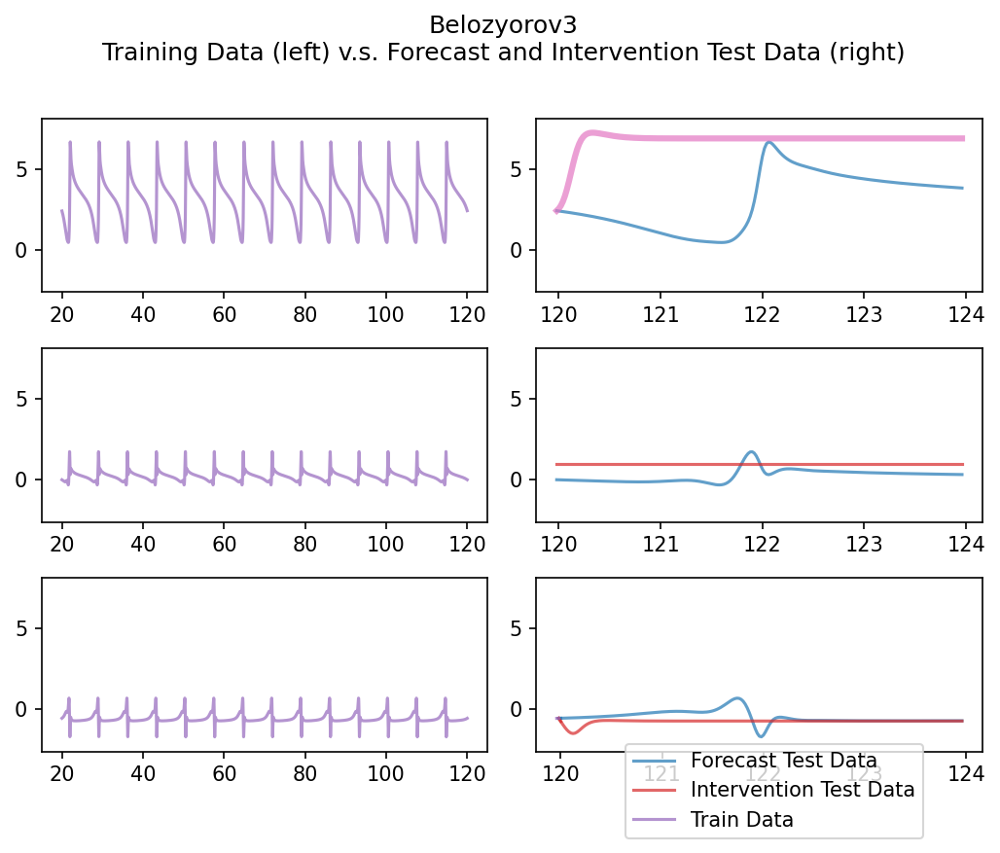

DATA GENERATOR NAME: 
	CoupledLogisticMapAllToAll

MODEL_TYPE: 
	interfere.dynamics.coupled_logistic_map

DOCUMENTATION FOR MODEL: 

Initializes an N-dimensional coupled logistic map model.
    
    A coupled map lattice where coupling is determined by the passed
    adjacency matrix and the map applied is the logistic map.

    x[n+1]_i = (1 - eps) * f(x[n]_i) + (eps / degree(i)) sum_j Aij f(x[n]_j)

    where f(x) = logistic_param * x * (1 - x).

    Args:
        adjacency_matrix (2D array): The adjacency matrix that defines the
            way the variables are coupled. The entry A[i, j] should contain
            the weight of the link from x_j to x_i.
        logistic_param (float): The logistic map weight parameter   
            r, where the map is f(x) = rx(1-x).
        eps (float): A parameter that controls the relative strenth of    
            coupling. High epsilon means greater connection to neighbors.
        sigma (float): The standard deviation of the additive gaussi

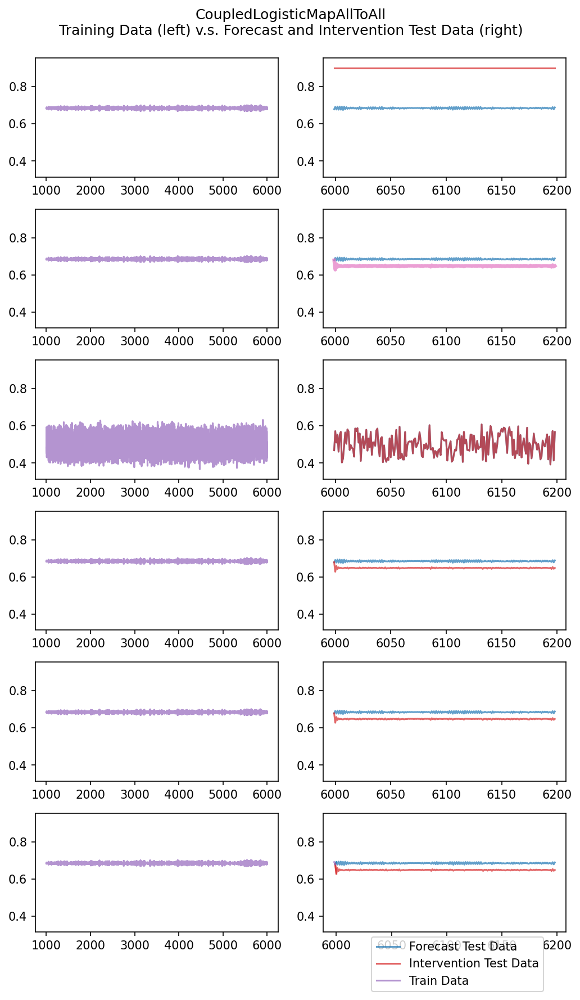

DATA GENERATOR NAME: 
	CoupledLogisticMapTwoCycles

MODEL_TYPE: 
	interfere.dynamics.coupled_logistic_map

DOCUMENTATION FOR MODEL: 

Initializes an N-dimensional coupled logistic map model.
    
    A coupled map lattice where coupling is determined by the passed
    adjacency matrix and the map applied is the logistic map.

    x[n+1]_i = (1 - eps) * f(x[n]_i) + (eps / degree(i)) sum_j Aij f(x[n]_j)

    where f(x) = logistic_param * x * (1 - x).

    Args:
        adjacency_matrix (2D array): The adjacency matrix that defines the
            way the variables are coupled. The entry A[i, j] should contain
            the weight of the link from x_j to x_i.
        logistic_param (float): The logistic map weight parameter   
            r, where the map is f(x) = rx(1-x).
        eps (float): A parameter that controls the relative strenth of    
            coupling. High epsilon means greater connection to neighbors.
        sigma (float): The standard deviation of the additive gauss

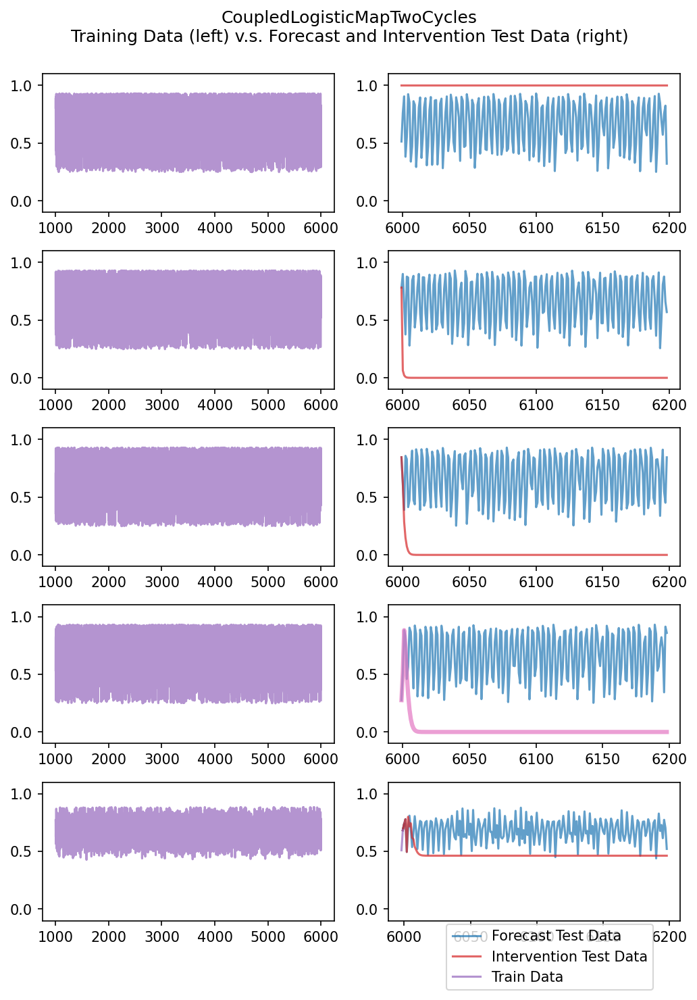

DATA GENERATOR NAME: 
	CoupledLogisticMapOneCycle

MODEL_TYPE: 
	interfere.dynamics.coupled_logistic_map

DOCUMENTATION FOR MODEL: 

Initializes an N-dimensional coupled logistic map model.
    
    A coupled map lattice where coupling is determined by the passed
    adjacency matrix and the map applied is the logistic map.

    x[n+1]_i = (1 - eps) * f(x[n]_i) + (eps / degree(i)) sum_j Aij f(x[n]_j)

    where f(x) = logistic_param * x * (1 - x).

    Args:
        adjacency_matrix (2D array): The adjacency matrix that defines the
            way the variables are coupled. The entry A[i, j] should contain
            the weight of the link from x_j to x_i.
        logistic_param (float): The logistic map weight parameter   
            r, where the map is f(x) = rx(1-x).
        eps (float): A parameter that controls the relative strenth of    
            coupling. High epsilon means greater connection to neighbors.
        sigma (float): The standard deviation of the additive gaussi

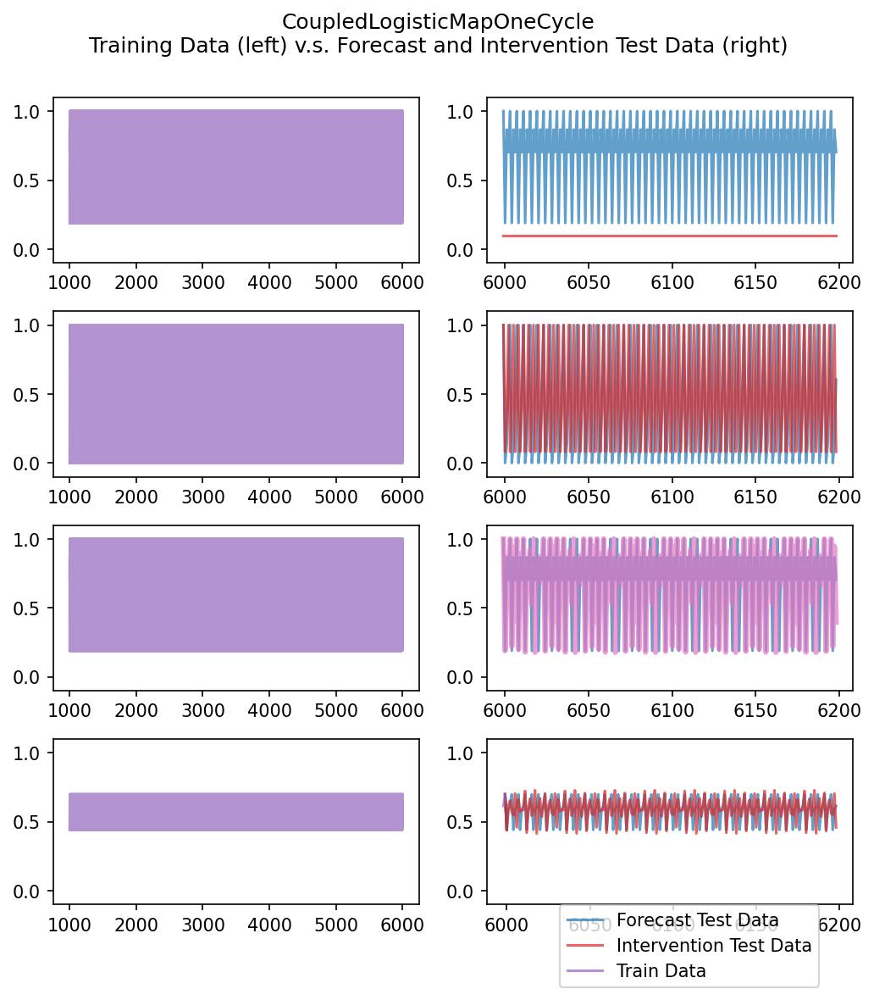

DATA GENERATOR NAME: 
	CoupledMapLatticeChaoticBrownian

MODEL_TYPE: 
	interfere.dynamics.coupled_map_1dlattice_chaotic_brownian

DOCUMENTATION FOR MODEL: 

Intitializes a specific parameterization of a CoupledMapLattice.

    Parameters taken from S2.3.1 of the supplimental material of
    Cliff et. al. 2023 "Unifying Pairwise..."

    The dynamics are governed by the following equation:

    x[n+1]_i = (1 - eps) * f(x[n]_i) + (eps / 2) * (f(x[n]_i+1) + f(x[n]_i-1))

    with:
        f(x) = 1 - alpha * x^2
        eps = 0.1
        alpha = 1.85

    Args:
        dim (int): The number of nodes in the model.
        sigma (float): The standard deviation of the additive gaussian noise
            in the model.
        measurement_noise_std (ndarray): None, or a vector with shape (n,)
            where each entry corresponds to the standard deviation of the
            measurement noise for that particular dimension of the dynamic
            model. For example, if the dynamic model had

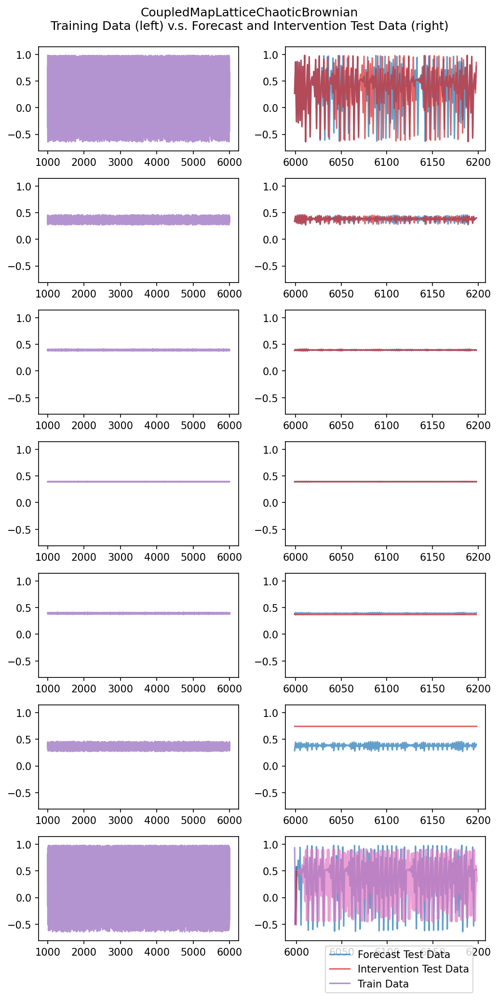

DATA GENERATOR NAME: 
	CoupledMapLatticeDefectTurbulence

MODEL_TYPE: 
	interfere.dynamics.coupled_map_1dlattice_defect_turbulence

DOCUMENTATION FOR MODEL: 

Intitializes a specific parameterization of a CoupledMapLattice.

    Parameters taken from S2.3.1 of the supplimental material of
    Cliff et. al. 2023 "Unifying Pairwise..."

    The dynamics are governed by the following equation:

    x[n+1]_i = (1 - eps) * f(x[n]_i) + (eps / 2) * (f(x[n]_i+1) + f(x[n]_i-1))

    with:
        f(x) = 1 - alpha * x^2
        eps = 0.1
        alpha = 1.895

    Args:
        dim (int): The number of nodes in the model.
        sigma (float): The standard deviation of the additive gaussian noise
            in the model.
        measurement_noise_std (ndarray): None, or a vector with shape (n,)
            where each entry corresponds to the standard deviation of the
            measurement noise for that particular dimension of the dynamic
            model. For example, if the dynamic model 

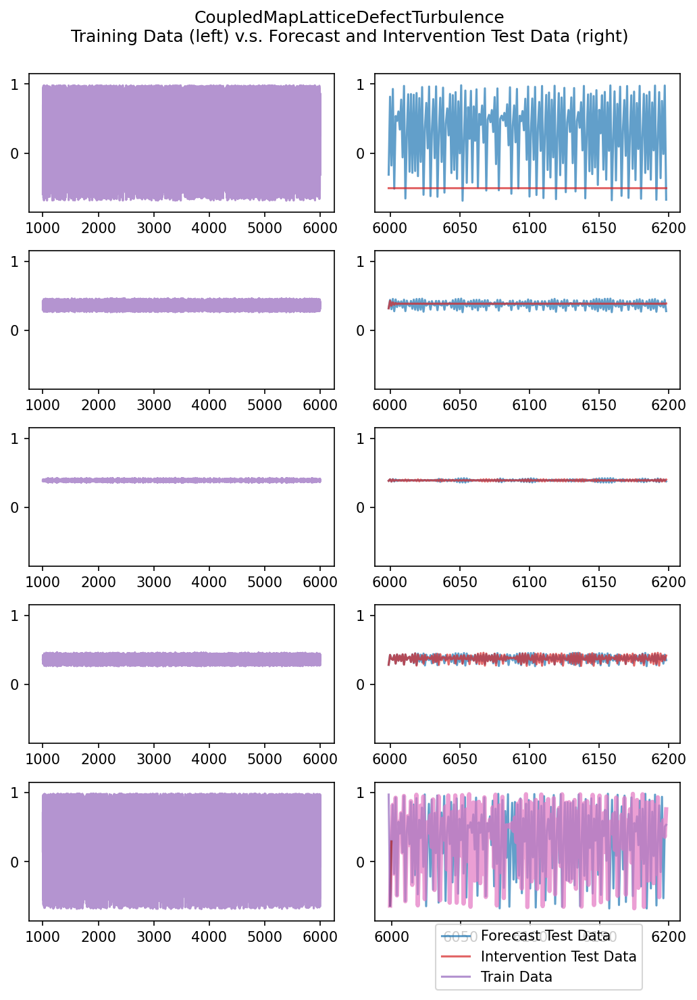

DATA GENERATOR NAME: 
	CoupledMapLatticePatternSelection

MODEL_TYPE: 
	interfere.dynamics.coupled_map_1dlattice_pattern_selection

DOCUMENTATION FOR MODEL: 

Intitializes a specific parameterization of a CoupledMapLattice.

    Parameters taken from S2.3.1 of the supplimental material of
    Cliff et. al. 2023 "Unifying Pairwise..."

    The dynamics are governed by the following equation:

    x[n+1]_i = (1 - eps) * f(x[n]_i) + (eps / 2) * (f(x[n]_i+1) + f(x[n]_i-1))

    with:
        f(x) = 1 - alpha * x^2
        eps = 0.4
        alpha = 1.71

    Args:
        dim (int): The number of nodes in the model.
        sigma (float): The standard deviation of the additive gaussian noise
            in the model.
        measurement_noise_std (ndarray): None, or a vector with shape (n,)
            where each entry corresponds to the standard deviation of the
            measurement noise for that particular dimension of the dynamic
            model. For example, if the dynamic model h

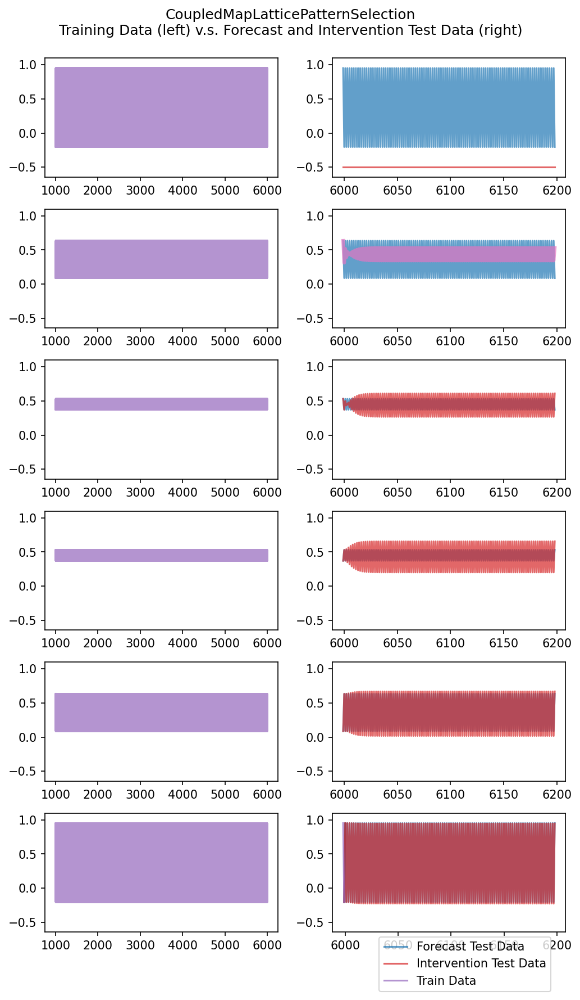

DATA GENERATOR NAME: 
	CoupledMapLatticeSpatioTempChaos

MODEL_TYPE: 
	interfere.dynamics.coupled_map_1dlattice_spatiotemp_chaos

DOCUMENTATION FOR MODEL: 

Intitializes a specific parameterization of a CoupledMapLattice.

    Parameters taken from S2.3.1 of the supplimental material of
    Cliff et. al. 2023 "Unifying Pairwise..."

    The dynamics are governed by the following equation:

    x[n+1]_i = (1 - eps) * f(x[n]_i) + (eps / 2) * (f(x[n]_i+1) + f(x[n]_i-1))

    with:
        f(x) = 1 - alpha * x^2
        eps = 0.3
        alpha = 2.0

    Args:
        dim (int): The number of nodes in the model.
        sigma (float): The standard deviation of the additive gaussian noise
            in the model.
        measurement_noise_std (ndarray): None, or a vector with shape (n,)
            where each entry corresponds to the standard deviation of the
            measurement noise for that particular dimension of the dynamic
            model. For example, if the dynamic model had 

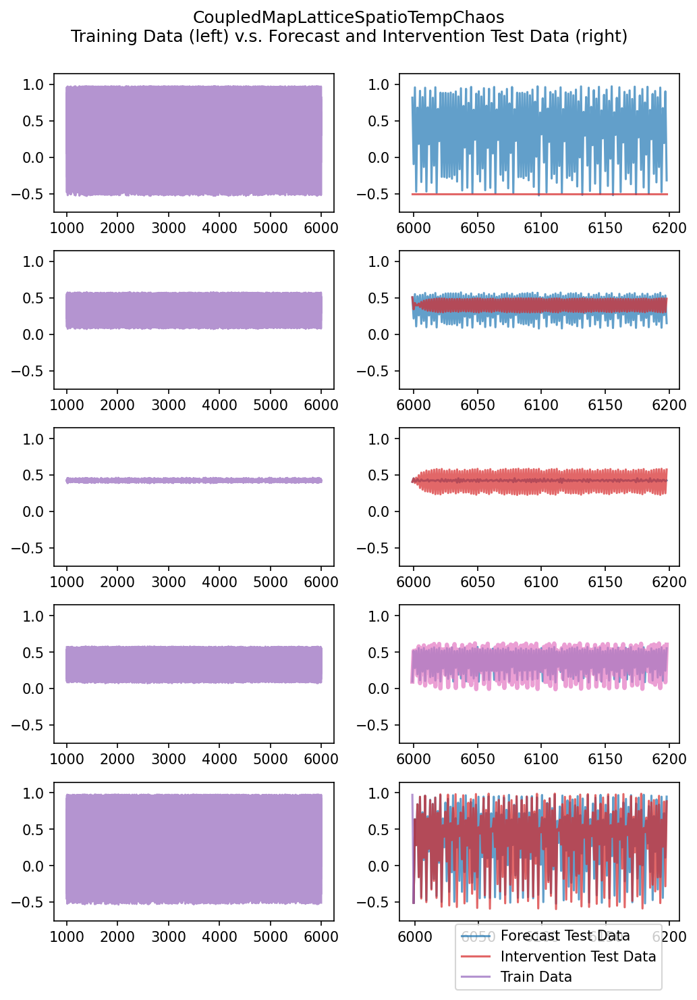

DATA GENERATOR NAME: 
	CoupledMapLatticeSpatioTempIntermit

MODEL_TYPE: 
	interfere.dynamics.coupled_map_1dlattice_spatiotemp_intermit1

DOCUMENTATION FOR MODEL: 

Intitializes a specific parameterization of a CoupledMapLattice.

    Parameters taken from S2.3.1 of the supplimental material of
    Cliff et. al. 2023 "Unifying Pairwise..."

    The dynamics are governed by the following equation:

    x[n+1]_i = (1 - eps) * f(x[n]_i) + (eps / 2) * (f(x[n]_i+1) + f(x[n]_i-1))

    with:
        f(x) = 1 - alpha * x^2
        eps = 0.00115
        alpha = 1.7522
        and only observed every 12 time steps.

    Args:
        dim (int): The number of nodes in the model.
        sigma (float): The standard deviation of the additive gaussian noise
            in the model.
        measurement_noise_std (ndarray): None, or a vector with shape (n,)
            where each entry corresponds to the standard deviation of the
            measurement noise for that particular dimension of the dyna

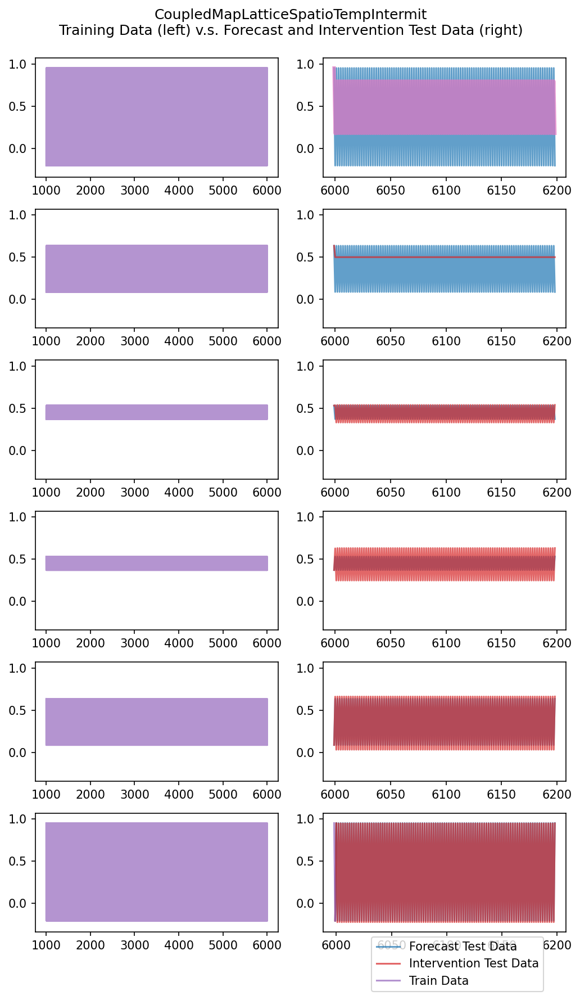

DATA GENERATOR NAME: 
	ImaginaryRoots4D

MODEL_TYPE: 
	interfere.dynamics.imag_roots_4d_linear_sde

DOCUMENTATION FOR MODEL: 

Initializes a linear SDE with pure imaginary eigenvalues.

    The system has the form:

        dX = AX dt + Sigma dW

    Where dW is a 4D vector of independent brownian increments and

    A = np.array([
        [ 0.54748989, -3.28156307,  1.5146247 , -1.29057552],
        [ 1.17925623,  0.19553371, -0.39465974, -1.60525885],
        [ 0.14984667,  1.40491579, -0.4096218 , -3.29551032],
        [ 0.50900001, -0.24048083,  1.16530899, -0.3334018 ]
    ])

    Sigma = sigma * I

    Args:
        sigma (float): controls the magnitude of the brownian noise.        
    

PARAMS:

sigma = 0



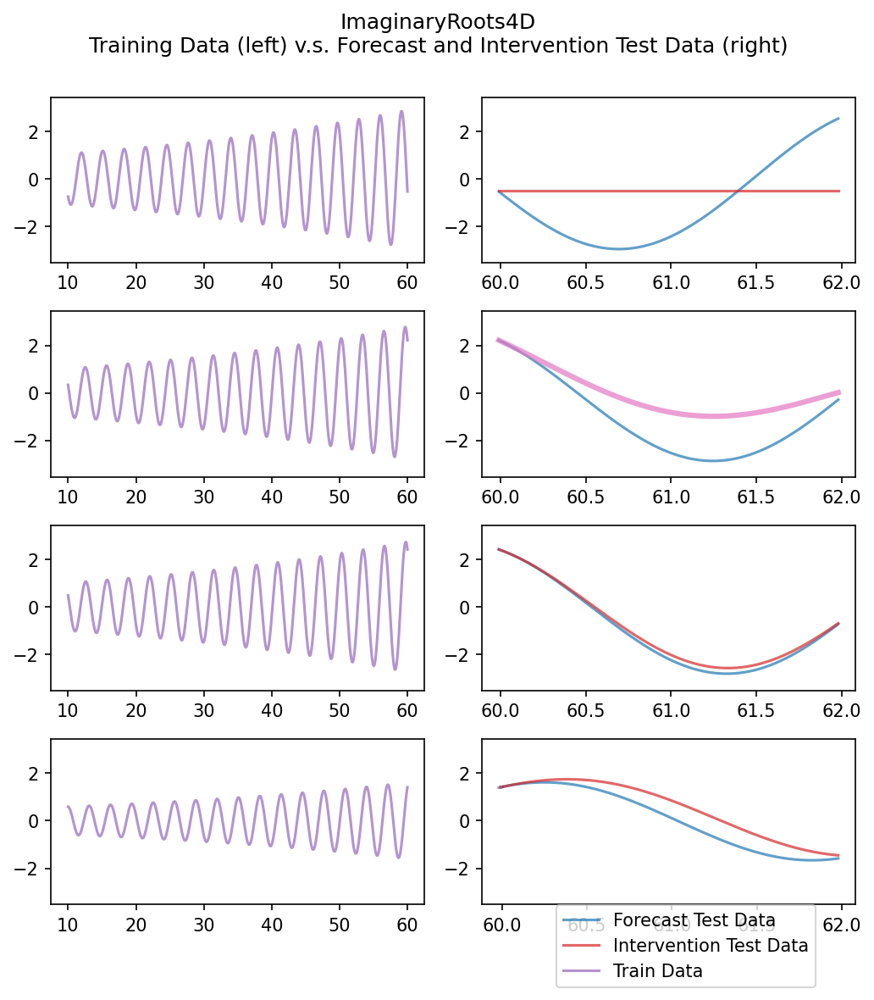

DATA GENERATOR NAME: 
	KuramotoOscilator1

MODEL_TYPE: 
	interfere.dynamics.Kuramoto

DOCUMENTATION FOR MODEL: 

Initializes a Kuramoto SDE with independent noise. 

        dtheta_i = (omega_i + (K/M) sum_j a_{ij} sin(theta_j - theta_i)) dt +
        sigma dW_i

        where M is the number of nodes in the network.

        The model returns sin(theta) to avoid discontinuities in the phase.
        Similarly, the intervention is operates on the phase, but sin(x) is
        applied to every state after the simulation is finished. 

        Args:
            omega (np.ndarray): The  natural frequency of each oscilator.
            K (float): The coupling constant.
            adjacency_matrix (np.ndarray): A matrix containing the connectivity.
            sigma (float): Parameter controlling the standard deiation of     
                system noise.
            measurement_noise_std (ndarray): None, or a vector with shape (n,)
                where each entry corresponds to the standa

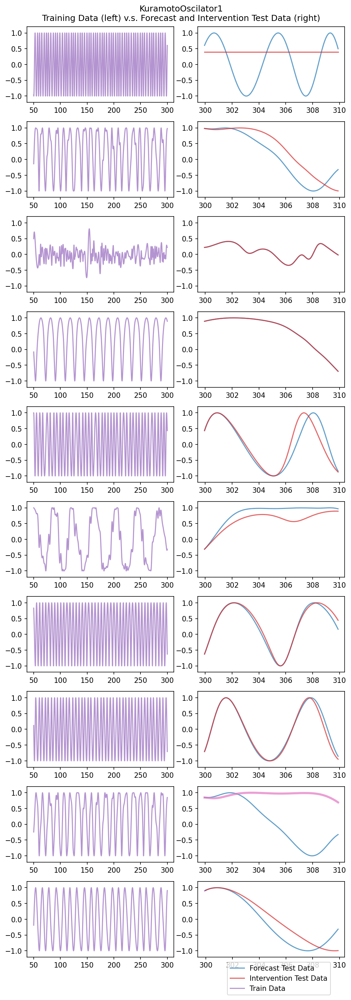

DATA GENERATOR NAME: 
	KuramotoOscilator2

MODEL_TYPE: 
	interfere.dynamics.Kuramoto

DOCUMENTATION FOR MODEL: 

Initializes a Kuramoto SDE with independent noise. 

        dtheta_i = (omega_i + (K/M) sum_j a_{ij} sin(theta_j - theta_i)) dt +
        sigma dW_i

        where M is the number of nodes in the network.

        The model returns sin(theta) to avoid discontinuities in the phase.
        Similarly, the intervention is operates on the phase, but sin(x) is
        applied to every state after the simulation is finished. 

        Args:
            omega (np.ndarray): The  natural frequency of each oscilator.
            K (float): The coupling constant.
            adjacency_matrix (np.ndarray): A matrix containing the connectivity.
            sigma (float): Parameter controlling the standard deiation of     
                system noise.
            measurement_noise_std (ndarray): None, or a vector with shape (n,)
                where each entry corresponds to the standa

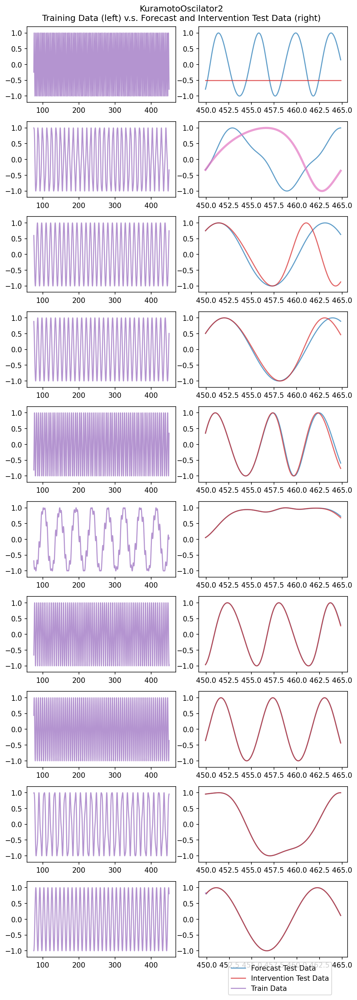

DATA GENERATOR NAME: 
	KuramotoOscilator3

MODEL_TYPE: 
	interfere.dynamics.Kuramoto

DOCUMENTATION FOR MODEL: 

Initializes a Kuramoto SDE with independent noise. 

        dtheta_i = (omega_i + (K/M) sum_j a_{ij} sin(theta_j - theta_i)) dt +
        sigma dW_i

        where M is the number of nodes in the network.

        The model returns sin(theta) to avoid discontinuities in the phase.
        Similarly, the intervention is operates on the phase, but sin(x) is
        applied to every state after the simulation is finished. 

        Args:
            omega (np.ndarray): The  natural frequency of each oscilator.
            K (float): The coupling constant.
            adjacency_matrix (np.ndarray): A matrix containing the connectivity.
            sigma (float): Parameter controlling the standard deiation of     
                system noise.
            measurement_noise_std (ndarray): None, or a vector with shape (n,)
                where each entry corresponds to the standa

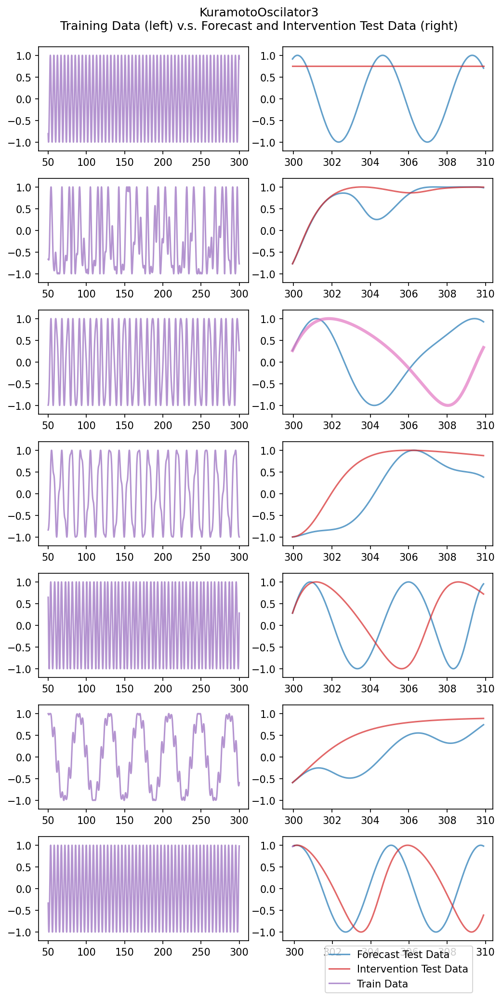

DATA GENERATOR NAME: 
	KuramotoOscilator4

MODEL_TYPE: 
	interfere.dynamics.Kuramoto

DOCUMENTATION FOR MODEL: 

Initializes a Kuramoto SDE with independent noise. 

        dtheta_i = (omega_i + (K/M) sum_j a_{ij} sin(theta_j - theta_i)) dt +
        sigma dW_i

        where M is the number of nodes in the network.

        The model returns sin(theta) to avoid discontinuities in the phase.
        Similarly, the intervention is operates on the phase, but sin(x) is
        applied to every state after the simulation is finished. 

        Args:
            omega (np.ndarray): The  natural frequency of each oscilator.
            K (float): The coupling constant.
            adjacency_matrix (np.ndarray): A matrix containing the connectivity.
            sigma (float): Parameter controlling the standard deiation of     
                system noise.
            measurement_noise_std (ndarray): None, or a vector with shape (n,)
                where each entry corresponds to the standa

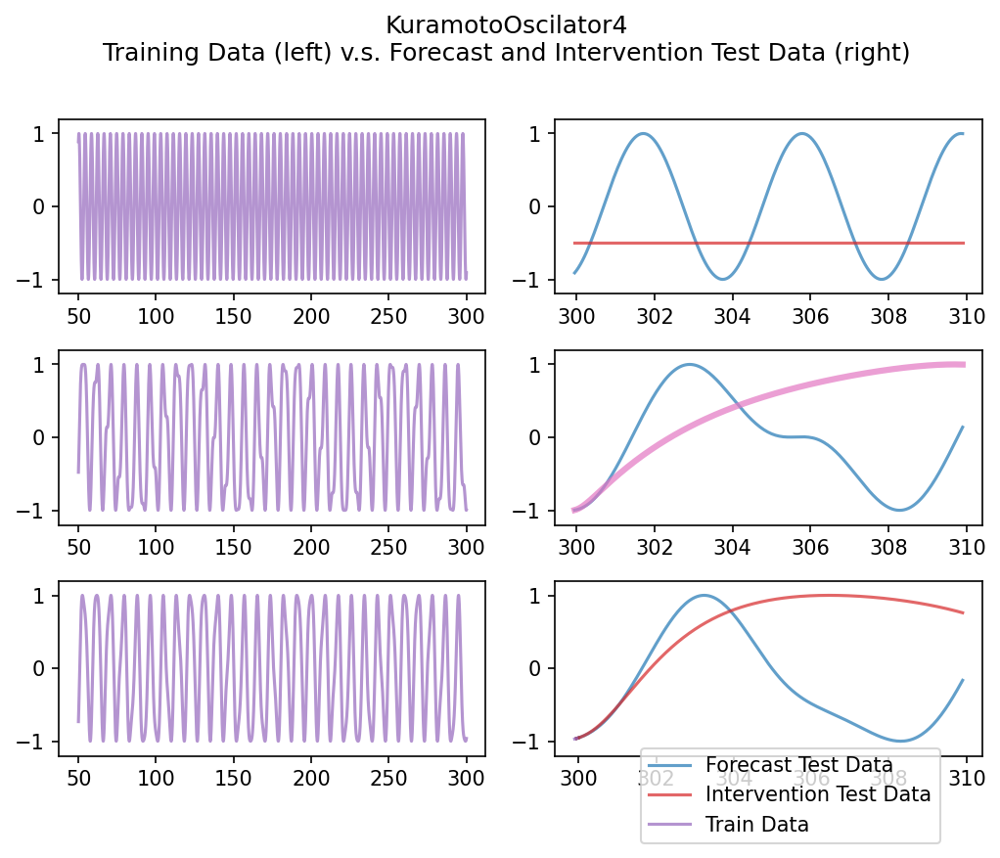

DATA GENERATOR NAME: 
	KuramotoSakaguchi1

MODEL_TYPE: 
	interfere.dynamics.KuramotoSakaguchi

DOCUMENTATION FOR MODEL: 

Initializes a Kuramoto-Sakaguchi SDE with independent noise. 

        dtheta_i = 
            (omega_i + (K/M) sum_j a_{ij} sin(theta_j - theta_i - Z_{ij)}) dt
            + sigma dW_i

        where M is the number of nodes in the network and Z is the phase
        frustration matrix.

        Args:
            omega (np.ndarray): The  natural frequency of each oscilator.
            K (float): The coupling constant.
            adjacency_matrix (np.ndarray): A matrix containing the connectivity.
                The matrix a_{ij} in the equation above.
            phase_frustration (np.ndarray): A matrix containing the phase
                frustration network. Z_{ij} in the equation above.
            sigma (float): Parameter controlling the standard deiation of     
                system noise.
            measurement_noise_std (ndarray): None, or a vector with

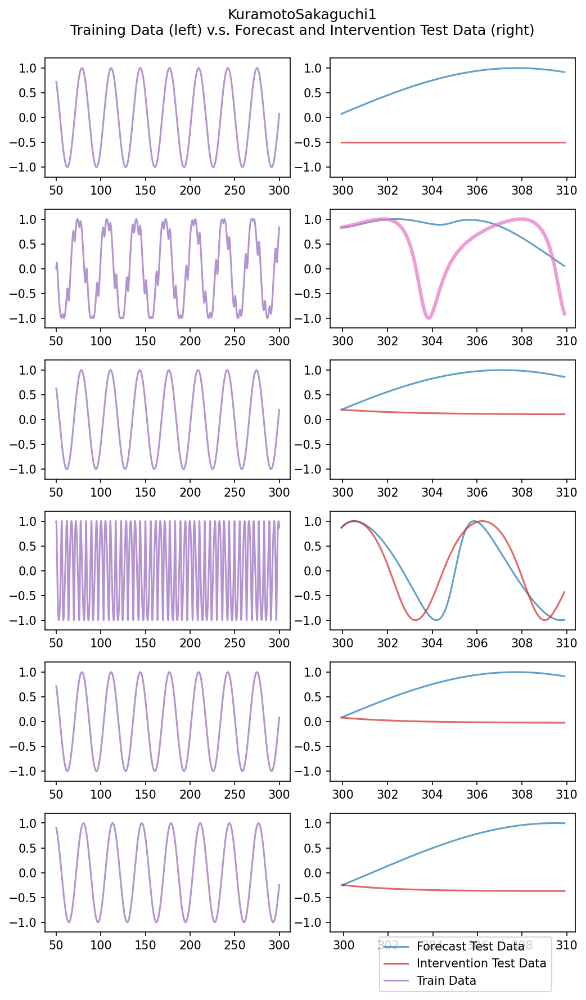

DATA GENERATOR NAME: 
	KuramotoSakaguchi2

MODEL_TYPE: 
	interfere.dynamics.KuramotoSakaguchi

DOCUMENTATION FOR MODEL: 

Initializes a Kuramoto-Sakaguchi SDE with independent noise. 

        dtheta_i = 
            (omega_i + (K/M) sum_j a_{ij} sin(theta_j - theta_i - Z_{ij)}) dt
            + sigma dW_i

        where M is the number of nodes in the network and Z is the phase
        frustration matrix.

        Args:
            omega (np.ndarray): The  natural frequency of each oscilator.
            K (float): The coupling constant.
            adjacency_matrix (np.ndarray): A matrix containing the connectivity.
                The matrix a_{ij} in the equation above.
            phase_frustration (np.ndarray): A matrix containing the phase
                frustration network. Z_{ij} in the equation above.
            sigma (float): Parameter controlling the standard deiation of     
                system noise.
            measurement_noise_std (ndarray): None, or a vector with

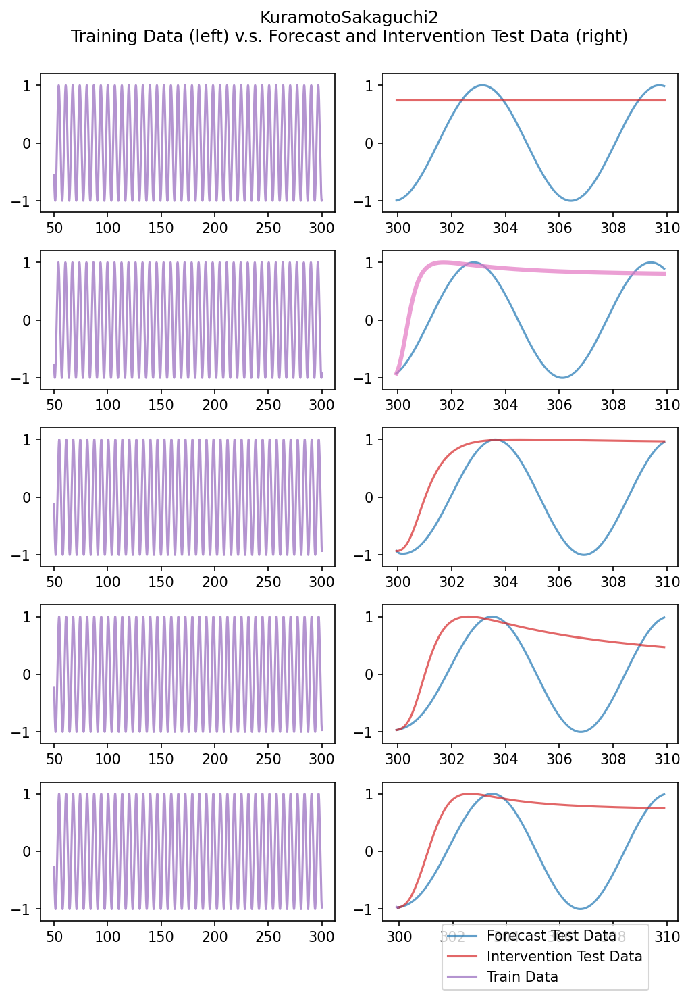

DATA GENERATOR NAME: 
	KuramotoSakaguchi3

MODEL_TYPE: 
	interfere.dynamics.KuramotoSakaguchi

DOCUMENTATION FOR MODEL: 

Initializes a Kuramoto-Sakaguchi SDE with independent noise. 

        dtheta_i = 
            (omega_i + (K/M) sum_j a_{ij} sin(theta_j - theta_i - Z_{ij)}) dt
            + sigma dW_i

        where M is the number of nodes in the network and Z is the phase
        frustration matrix.

        Args:
            omega (np.ndarray): The  natural frequency of each oscilator.
            K (float): The coupling constant.
            adjacency_matrix (np.ndarray): A matrix containing the connectivity.
                The matrix a_{ij} in the equation above.
            phase_frustration (np.ndarray): A matrix containing the phase
                frustration network. Z_{ij} in the equation above.
            sigma (float): Parameter controlling the standard deiation of     
                system noise.
            measurement_noise_std (ndarray): None, or a vector with

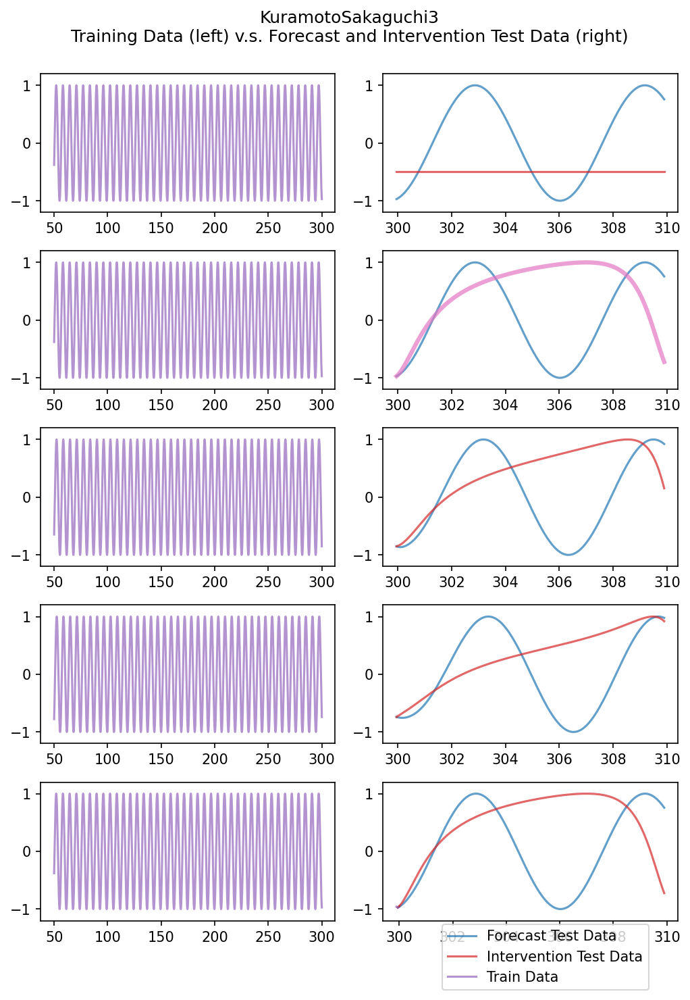

DATA GENERATOR NAME: 
	Liping3DQuadFinance1

MODEL_TYPE: 
	interfere.dynamics.Liping3DQuadFinance

DOCUMENTATION FOR MODEL: 

Initializes a 3D quadradic chaotic system.

        dy1/dt = y3 + (y2 - 0.3)y1
        dy2/dt = 2 - 0.1y2 - y1^2
        dy3/dt = y1y2 - y1 - 0.1y3

        dY1 = dy1/dt(y) * dt + sigma * y1 * dW
        dY2 = dy1/dt(y) * dt + sigma * y2 * dW
        dY3 = dy1/dt(y) * dt + sigma * y3 * dW

        Taken from :
            Liping (2021). A new financial chaotic model in Atangana-Baleanu
            stochastic fractional differential equations.
        
        A fractional derivative is not used here--the d parameter in the paper
        is assumed to be 1 so the fractional derivative reduces to a normal
        derivative.

        Args:
            sigma (float): Coefficient on the independent Weiner increments.
            measurement_noise_std (ndarray): None, or a vector with shape (n,)
                where each entry corresponds to the standard deviation o

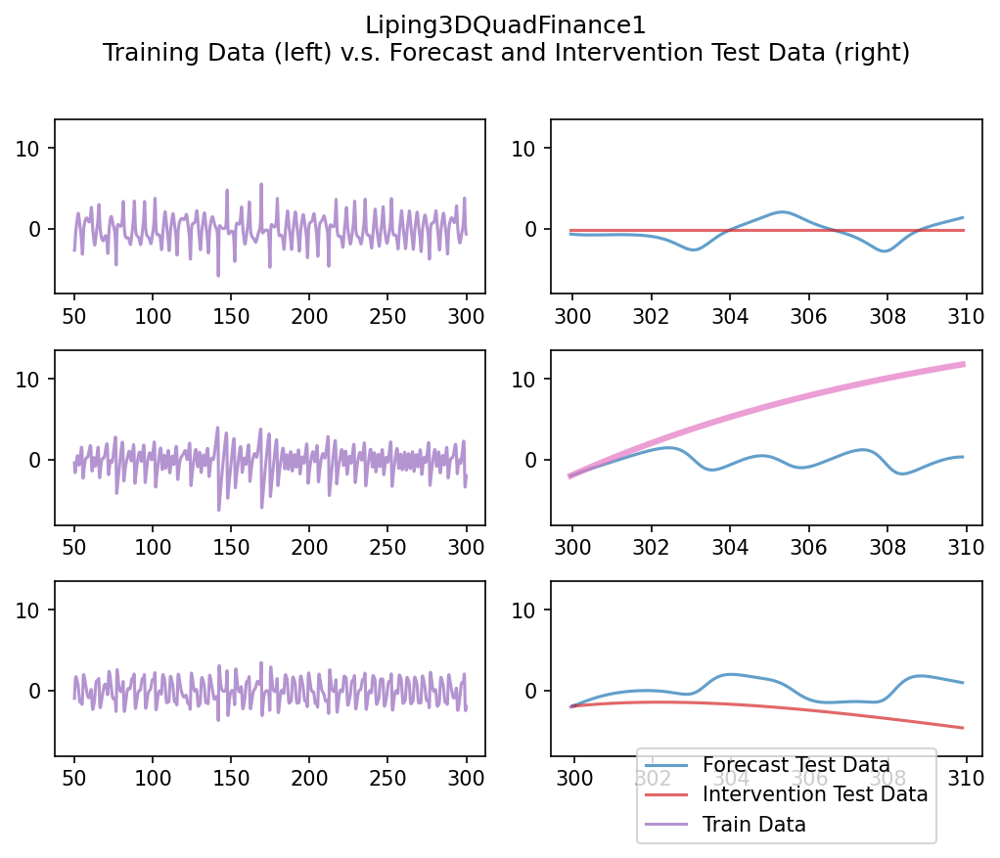

DATA GENERATOR NAME: 
	Liping3DQuadFinance2

MODEL_TYPE: 
	interfere.dynamics.Liping3DQuadFinance

DOCUMENTATION FOR MODEL: 

Initializes a 3D quadradic chaotic system.

        dy1/dt = y3 + (y2 - 0.3)y1
        dy2/dt = 2 - 0.1y2 - y1^2
        dy3/dt = y1y2 - y1 - 0.1y3

        dY1 = dy1/dt(y) * dt + sigma * y1 * dW
        dY2 = dy1/dt(y) * dt + sigma * y2 * dW
        dY3 = dy1/dt(y) * dt + sigma * y3 * dW

        Taken from :
            Liping (2021). A new financial chaotic model in Atangana-Baleanu
            stochastic fractional differential equations.
        
        A fractional derivative is not used here--the d parameter in the paper
        is assumed to be 1 so the fractional derivative reduces to a normal
        derivative.

        Args:
            sigma (float): Coefficient on the independent Weiner increments.
            measurement_noise_std (ndarray): None, or a vector with shape (n,)
                where each entry corresponds to the standard deviation o

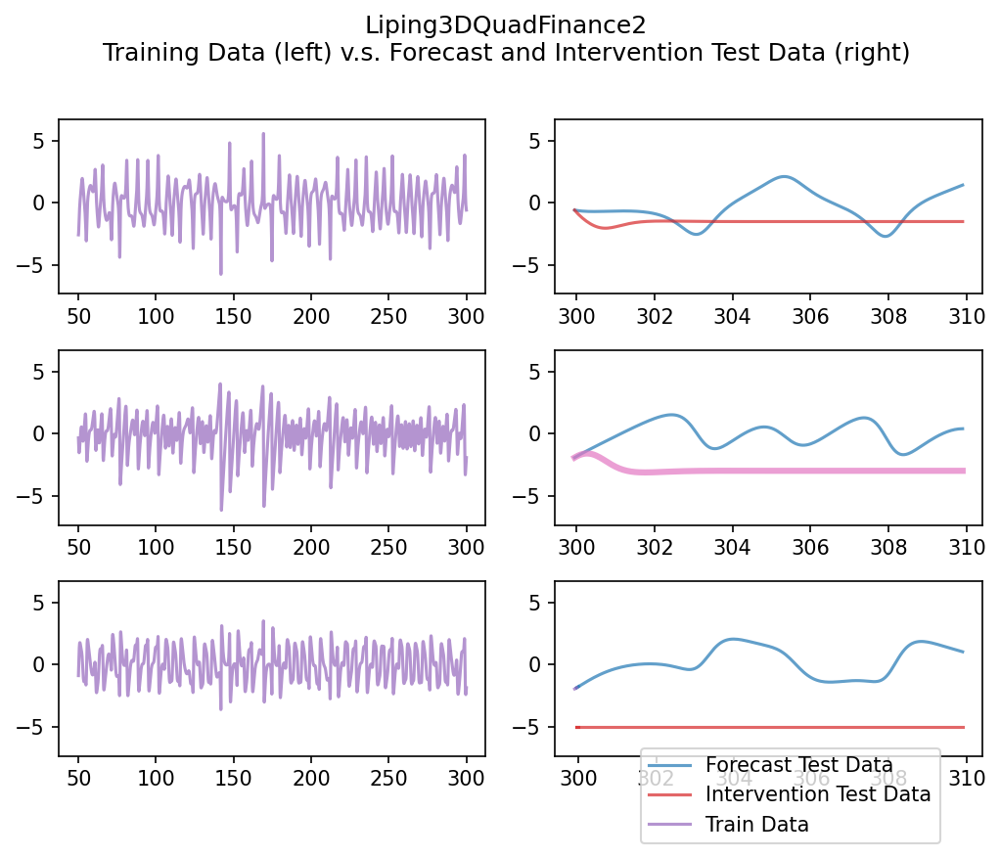

DATA GENERATOR NAME: 
	LotkaVoltera1

MODEL_TYPE: 
	interfere.dynamics.LotkaVolteraSDE

DOCUMENTATION FOR MODEL: 

Initializes class for simulating Lotka Voltera dynamics.

            dx_i/dt = r_i * x_i * (1 - x_i / k_i +  [A x]_i / k_i) + sigma * x_i
           * dW

        where r_i and k_i are the growth rates and carrying capacities of
        species i, A is the matrix of interspecies interactions and sigma
        is the magnitude of the effect of the Weiner process.

        See:
        * Vadillo 2019, "Comparing stochastic Lotka–Volterra predator-prey
        models"
        * https://en.wikipedia.org/wiki/Competitive_Lotka%E2%80%93Volterra_equations


        Args:
            growth_rates (ndarray): A length n vector of growth rates (r_i's).
            capacities (ndarray): A length n vector of carrying capacities 
                (k_i's).
            interaction_mat: A weighted (n, n) matrix of interspecies
                interactions. (A in the above equation.)
      

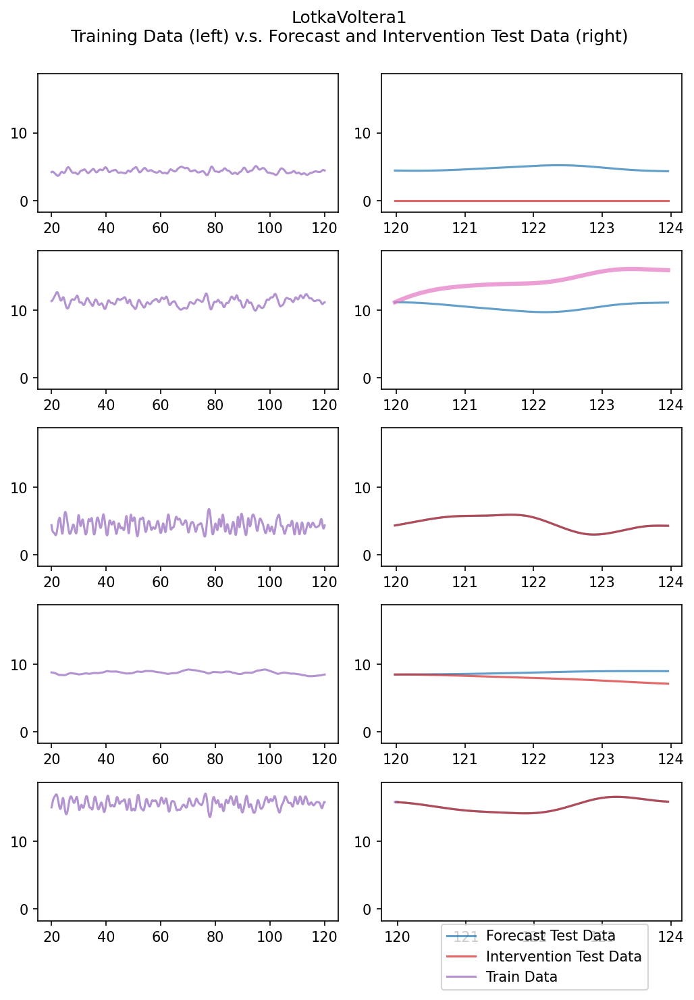

DATA GENERATOR NAME: 
	LotkaVoltera2

MODEL_TYPE: 
	interfere.dynamics.LotkaVolteraSDE

DOCUMENTATION FOR MODEL: 

Initializes class for simulating Lotka Voltera dynamics.

            dx_i/dt = r_i * x_i * (1 - x_i / k_i +  [A x]_i / k_i) + sigma * x_i
           * dW

        where r_i and k_i are the growth rates and carrying capacities of
        species i, A is the matrix of interspecies interactions and sigma
        is the magnitude of the effect of the Weiner process.

        See:
        * Vadillo 2019, "Comparing stochastic Lotka–Volterra predator-prey
        models"
        * https://en.wikipedia.org/wiki/Competitive_Lotka%E2%80%93Volterra_equations


        Args:
            growth_rates (ndarray): A length n vector of growth rates (r_i's).
            capacities (ndarray): A length n vector of carrying capacities 
                (k_i's).
            interaction_mat: A weighted (n, n) matrix of interspecies
                interactions. (A in the above equation.)
      

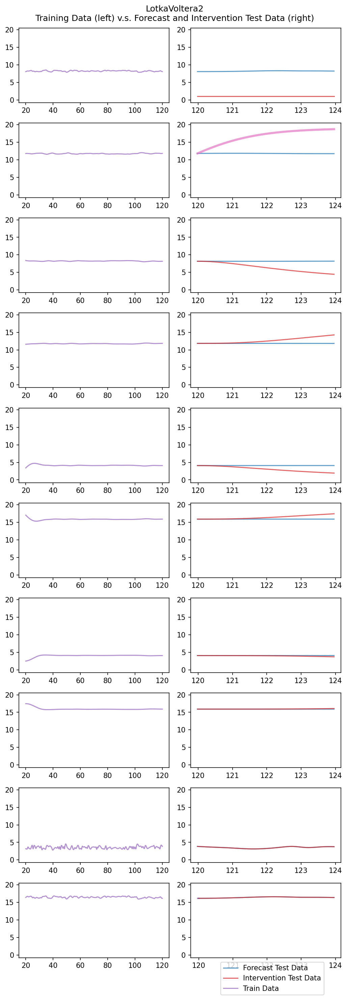

DATA GENERATOR NAME: 
	LotkaVoltera3

MODEL_TYPE: 
	interfere.dynamics.LotkaVolteraSDE

DOCUMENTATION FOR MODEL: 

Initializes class for simulating Lotka Voltera dynamics.

            dx_i/dt = r_i * x_i * (1 - x_i / k_i +  [A x]_i / k_i) + sigma * x_i
           * dW

        where r_i and k_i are the growth rates and carrying capacities of
        species i, A is the matrix of interspecies interactions and sigma
        is the magnitude of the effect of the Weiner process.

        See:
        * Vadillo 2019, "Comparing stochastic Lotka–Volterra predator-prey
        models"
        * https://en.wikipedia.org/wiki/Competitive_Lotka%E2%80%93Volterra_equations


        Args:
            growth_rates (ndarray): A length n vector of growth rates (r_i's).
            capacities (ndarray): A length n vector of carrying capacities 
                (k_i's).
            interaction_mat: A weighted (n, n) matrix of interspecies
                interactions. (A in the above equation.)
      

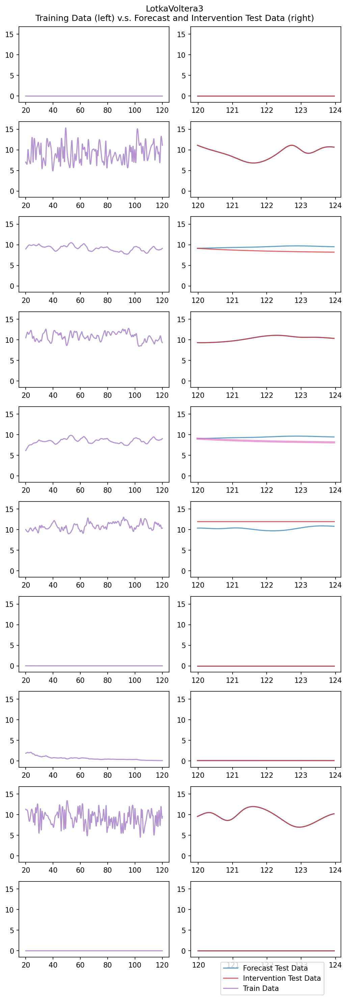

DATA GENERATOR NAME: 
	LotkaVoltera4

MODEL_TYPE: 
	interfere.dynamics.LotkaVolteraSDE

DOCUMENTATION FOR MODEL: 

Initializes class for simulating Lotka Voltera dynamics.

            dx_i/dt = r_i * x_i * (1 - x_i / k_i +  [A x]_i / k_i) + sigma * x_i
           * dW

        where r_i and k_i are the growth rates and carrying capacities of
        species i, A is the matrix of interspecies interactions and sigma
        is the magnitude of the effect of the Weiner process.

        See:
        * Vadillo 2019, "Comparing stochastic Lotka–Volterra predator-prey
        models"
        * https://en.wikipedia.org/wiki/Competitive_Lotka%E2%80%93Volterra_equations


        Args:
            growth_rates (ndarray): A length n vector of growth rates (r_i's).
            capacities (ndarray): A length n vector of carrying capacities 
                (k_i's).
            interaction_mat: A weighted (n, n) matrix of interspecies
                interactions. (A in the above equation.)
      

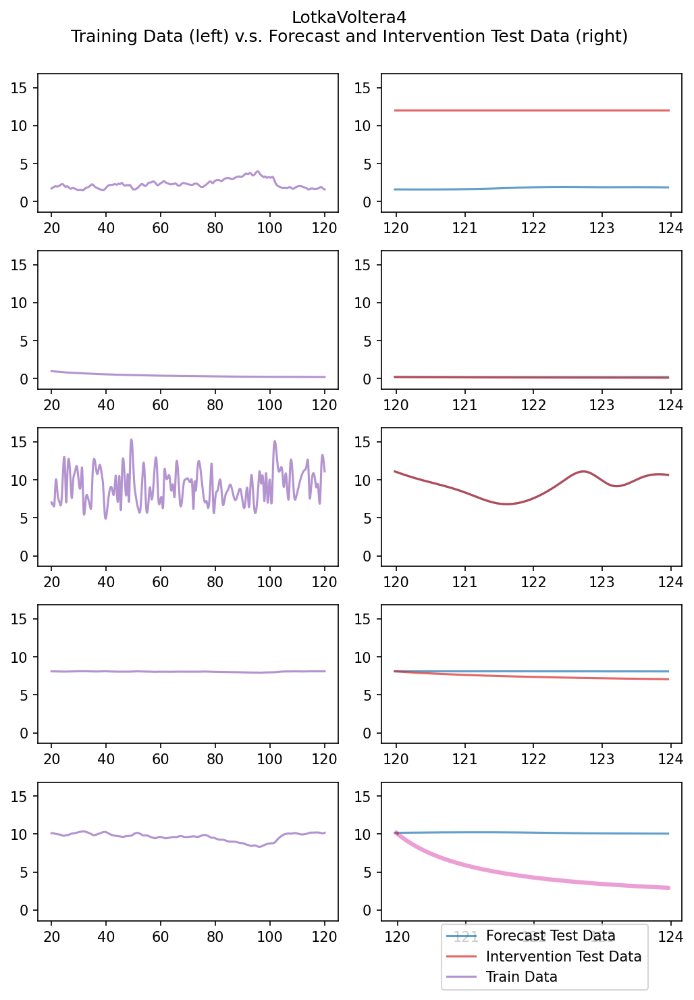

DATA GENERATOR NAME: 
	OrnsteinUhlenbeck1

MODEL_TYPE: 
	interfere.dynamics.OrnsteinUhlenbeck

DOCUMENTATION FOR MODEL: 

Initializes n-dimensional Ornstein Uhlenbeck process.

        dX = theta(mu - X)dt + sigma dW

        Args:
            theta (ndarray): A (n, n) matrix.
            mu (ndarray): A (n,) vector.
            sigma (ndarray): A (n, n) matrix.
            measurement_noise_std (ndarray): None, or a vector with shape (n,)
                where each entry corresponds to the standard deviation of the
                measurement noise for that particular dimension of the dynamic
                model. For example, if the dynamic model had two variables x1
                and x2 and `measurement_noise_std = [1, 10]`, then
                independent gaussian noise with standard deviation 1 and 10
                will be added to x1 and x2 respectively at each point in time.  
        

PARAMS:

mu = [0.25 0.25 0.25 0.25 0.25]

theta = [[ 3.56557309  0.40068276 -0.06194183

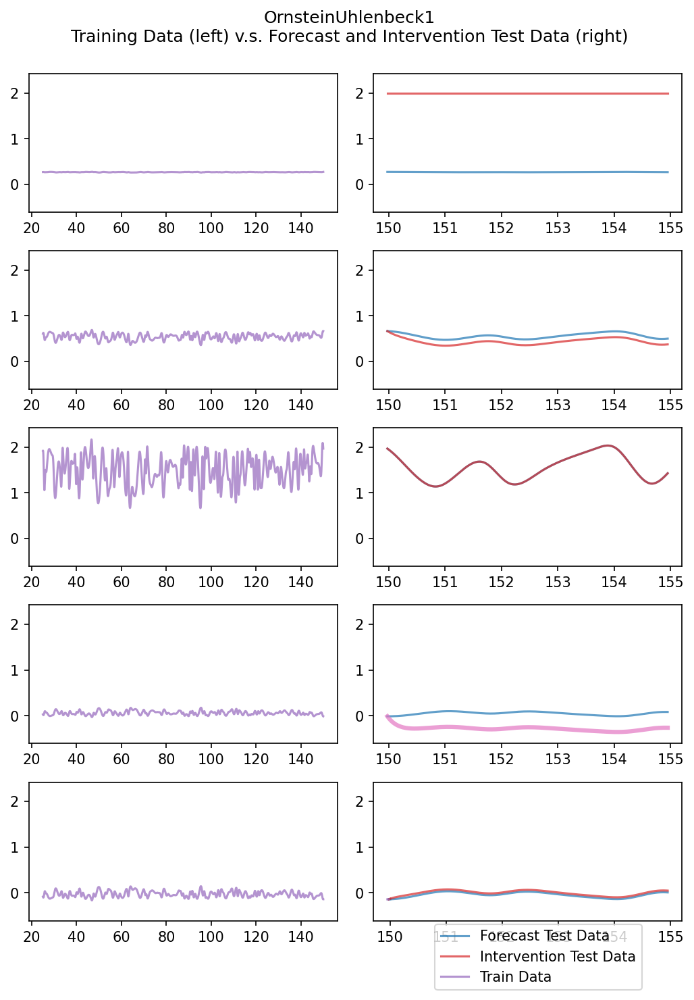

DATA GENERATOR NAME: 
	OrnsteinUhlenbeck2

MODEL_TYPE: 
	interfere.dynamics.OrnsteinUhlenbeck

DOCUMENTATION FOR MODEL: 

Initializes n-dimensional Ornstein Uhlenbeck process.

        dX = theta(mu - X)dt + sigma dW

        Args:
            theta (ndarray): A (n, n) matrix.
            mu (ndarray): A (n,) vector.
            sigma (ndarray): A (n, n) matrix.
            measurement_noise_std (ndarray): None, or a vector with shape (n,)
                where each entry corresponds to the standard deviation of the
                measurement noise for that particular dimension of the dynamic
                model. For example, if the dynamic model had two variables x1
                and x2 and `measurement_noise_std = [1, 10]`, then
                independent gaussian noise with standard deviation 1 and 10
                will be added to x1 and x2 respectively at each point in time.  
        

PARAMS:

mu = [0.25 0.25 0.25 0.25 0.25]

theta = [[ 7.09073381e-02 -4.35446589e-02 -3.

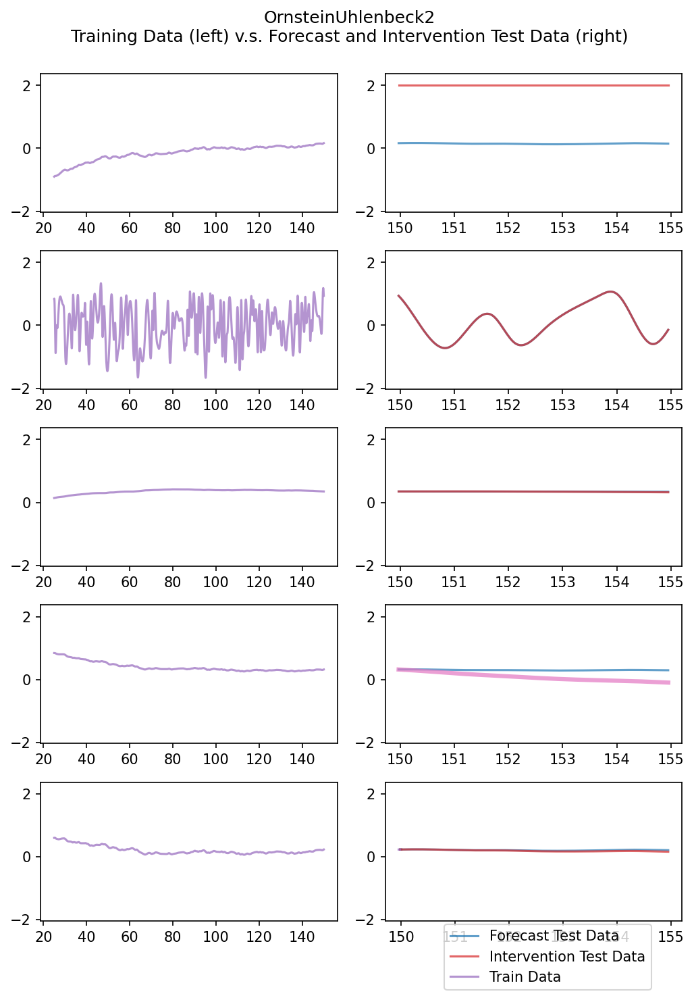

DATA GENERATOR NAME: 
	OrnsteinUhlenbeck3

MODEL_TYPE: 
	interfere.dynamics.OrnsteinUhlenbeck

DOCUMENTATION FOR MODEL: 

Initializes n-dimensional Ornstein Uhlenbeck process.

        dX = theta(mu - X)dt + sigma dW

        Args:
            theta (ndarray): A (n, n) matrix.
            mu (ndarray): A (n,) vector.
            sigma (ndarray): A (n, n) matrix.
            measurement_noise_std (ndarray): None, or a vector with shape (n,)
                where each entry corresponds to the standard deviation of the
                measurement noise for that particular dimension of the dynamic
                model. For example, if the dynamic model had two variables x1
                and x2 and `measurement_noise_std = [1, 10]`, then
                independent gaussian noise with standard deviation 1 and 10
                will be added to x1 and x2 respectively at each point in time.  
        

PARAMS:

mu = [0.25 0.25 0.25 0.25 0.25]

theta = [[ 7.8851358   0.95810051 -0.13271091

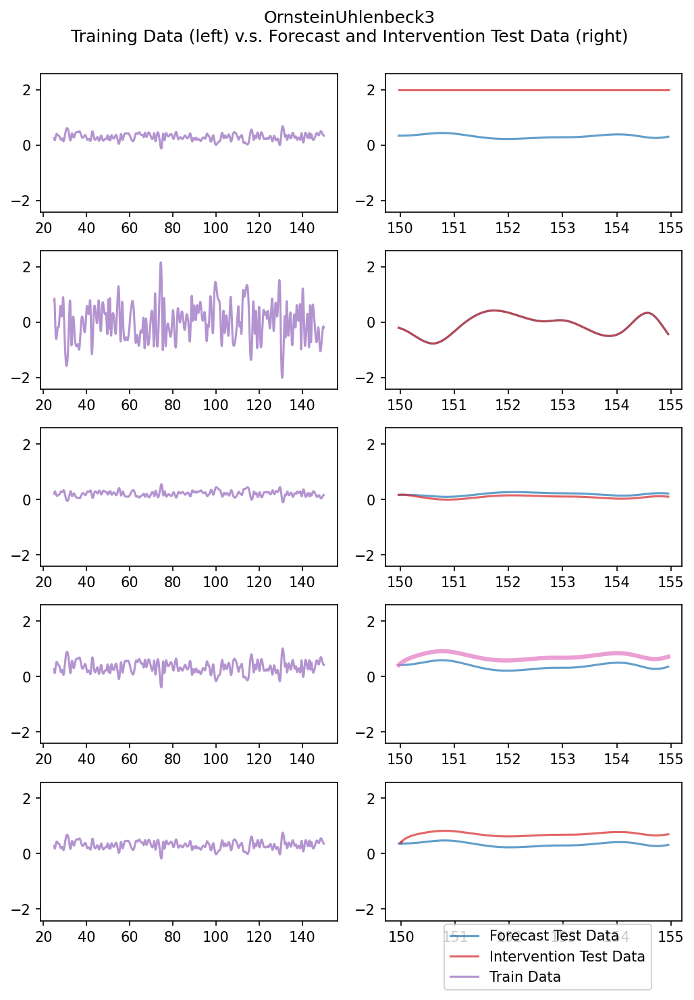

DATA GENERATOR NAME: 
	VARMA1SpatiotempChaos

MODEL_TYPE: 
	interfere.dynamics.VARMADynamics

DOCUMENTATION FOR MODEL: 

Initializes a vector autoregressive moving average model.

        z_n = a_n + sum_{i=1}^p phi_i z_(n-i) + sum_{i=1}^q theta_i a_{n-i}

        with each a_n ~ MultivariateNormal(0, Sigma).

        See S2.2 of the supplimental material in Cliff et. al 2023, "Unifying pairwise..."

        Args:
            phi_matrices (ndarray): A list of p (nxn) numpy arrays. The 
                autoregressive components of the model. The ith array 
                corresponds to phi_i in the formula above.
            theta_matrices (ndarray): A list of q (nxn) numpy arrays. The moving
                average component of the model. The ith array corresponds to
                theta_i in the formula above.
            sigma (ndarray): A (nxn) symmetric positive definite numpy array.
                The covariance of the noise.
            measurement_noise_std (ndarray): None, o

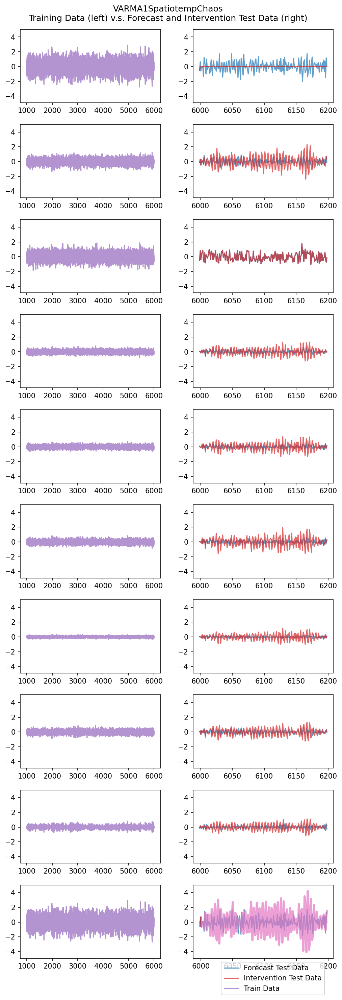

DATA GENERATOR NAME: 
	VARMA2ChaoticBrownian

MODEL_TYPE: 
	interfere.dynamics.VARMADynamics

DOCUMENTATION FOR MODEL: 

Initializes a vector autoregressive moving average model.

        z_n = a_n + sum_{i=1}^p phi_i z_(n-i) + sum_{i=1}^q theta_i a_{n-i}

        with each a_n ~ MultivariateNormal(0, Sigma).

        See S2.2 of the supplimental material in Cliff et. al 2023, "Unifying pairwise..."

        Args:
            phi_matrices (ndarray): A list of p (nxn) numpy arrays. The 
                autoregressive components of the model. The ith array 
                corresponds to phi_i in the formula above.
            theta_matrices (ndarray): A list of q (nxn) numpy arrays. The moving
                average component of the model. The ith array corresponds to
                theta_i in the formula above.
            sigma (ndarray): A (nxn) symmetric positive definite numpy array.
                The covariance of the noise.
            measurement_noise_std (ndarray): None, o

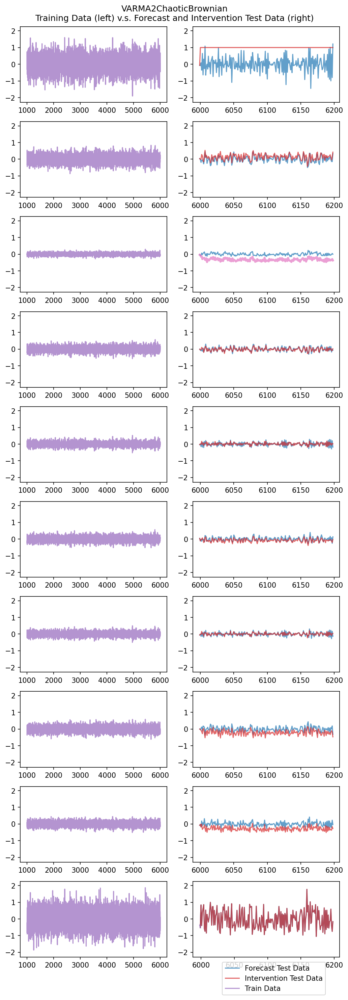

DATA GENERATOR NAME: 
	VARMA3LotkaVoltera

MODEL_TYPE: 
	interfere.dynamics.VARMADynamics

DOCUMENTATION FOR MODEL: 

Initializes a vector autoregressive moving average model.

        z_n = a_n + sum_{i=1}^p phi_i z_(n-i) + sum_{i=1}^q theta_i a_{n-i}

        with each a_n ~ MultivariateNormal(0, Sigma).

        See S2.2 of the supplimental material in Cliff et. al 2023, "Unifying pairwise..."

        Args:
            phi_matrices (ndarray): A list of p (nxn) numpy arrays. The 
                autoregressive components of the model. The ith array 
                corresponds to phi_i in the formula above.
            theta_matrices (ndarray): A list of q (nxn) numpy arrays. The moving
                average component of the model. The ith array corresponds to
                theta_i in the formula above.
            sigma (ndarray): A (nxn) symmetric positive definite numpy array.
                The covariance of the noise.
            measurement_noise_std (ndarray): None, or a

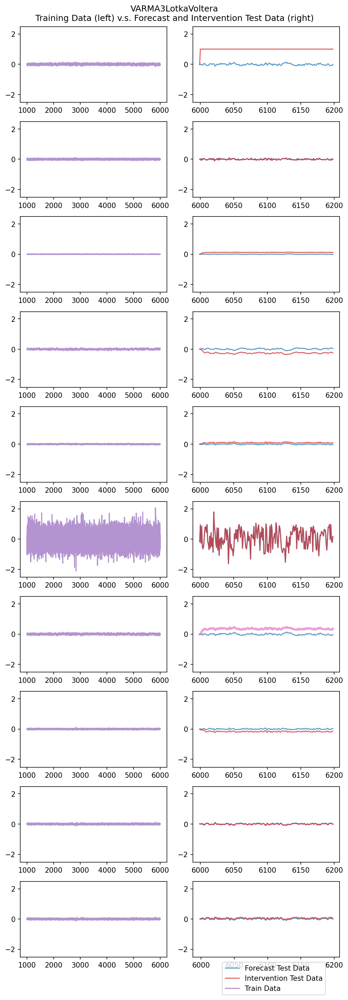

DATA GENERATOR NAME: 
	LotkaVolteraConfound

MODEL_TYPE: 
	interfere.dynamics.LotkaVolteraSDE

DOCUMENTATION FOR MODEL: 

Initializes class for simulating Lotka Voltera dynamics.

            dx_i/dt = r_i * x_i * (1 - x_i / k_i +  [A x]_i / k_i) + sigma * x_i
           * dW

        where r_i and k_i are the growth rates and carrying capacities of
        species i, A is the matrix of interspecies interactions and sigma
        is the magnitude of the effect of the Weiner process.

        See:
        * Vadillo 2019, "Comparing stochastic Lotka–Volterra predator-prey
        models"
        * https://en.wikipedia.org/wiki/Competitive_Lotka%E2%80%93Volterra_equations


        Args:
            growth_rates (ndarray): A length n vector of growth rates (r_i's).
            capacities (ndarray): A length n vector of carrying capacities 
                (k_i's).
            interaction_mat: A weighted (n, n) matrix of interspecies
                interactions. (A in the above equation.)

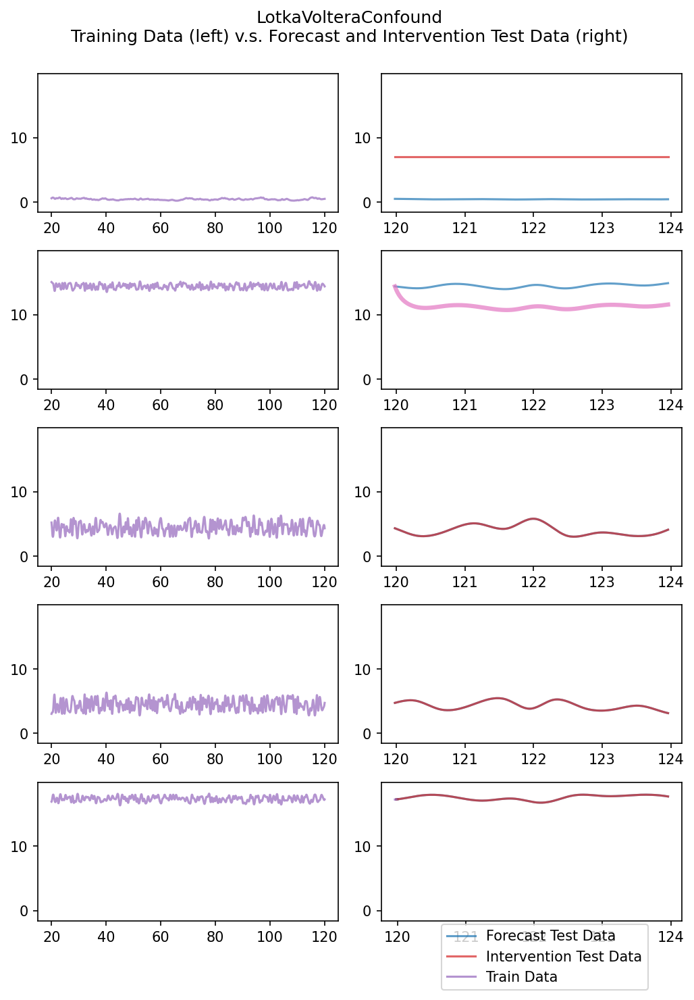

DATA GENERATOR NAME: 
	LotkaVolteraMediator

MODEL_TYPE: 
	interfere.dynamics.LotkaVolteraSDE

DOCUMENTATION FOR MODEL: 

Initializes class for simulating Lotka Voltera dynamics.

            dx_i/dt = r_i * x_i * (1 - x_i / k_i +  [A x]_i / k_i) + sigma * x_i
           * dW

        where r_i and k_i are the growth rates and carrying capacities of
        species i, A is the matrix of interspecies interactions and sigma
        is the magnitude of the effect of the Weiner process.

        See:
        * Vadillo 2019, "Comparing stochastic Lotka–Volterra predator-prey
        models"
        * https://en.wikipedia.org/wiki/Competitive_Lotka%E2%80%93Volterra_equations


        Args:
            growth_rates (ndarray): A length n vector of growth rates (r_i's).
            capacities (ndarray): A length n vector of carrying capacities 
                (k_i's).
            interaction_mat: A weighted (n, n) matrix of interspecies
                interactions. (A in the above equation.)

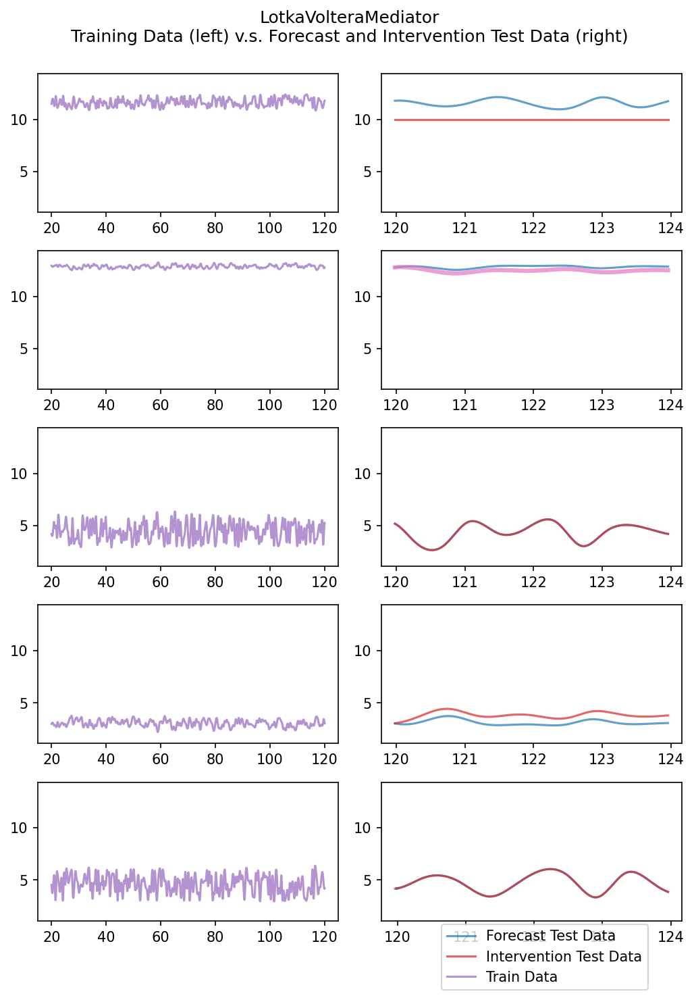

DATA GENERATOR NAME: 
	LotkaVolteraBlockableConfound

MODEL_TYPE: 
	interfere.dynamics.LotkaVoltera

DOCUMENTATION FOR MODEL: 

Initializes class for simulating Lotka Voltera dynamics.

            dx_i/dt = r_i * x_i * (1 - x_i / k_i +  [A x]_i / k_i)
        
        where r_i and k_i are the growth rates and carrying capacities of
        species i, A is the matrix of interspecies interactions.

        See:
        * Vadillo 2019, "Comparing stochastic Lotka–Volterra predator-prey
        models"
        * https://en.wikipedia.org/wiki/Competitive_Lotka%E2%80%93Volterra_equations        
        * https://github.com/netsiphd/netrd/blob/master/netrd/dynamics/lotka_volterra.py

        Args:
            growth_rates (ndarray): A length n vector of growth rates (r_i's).
            capacities (ndarray): A length n vector of carrying capacities 
                (k_i's).
            interaction_mat: A weighted (n, n) matrix of interspecies
                interactions. (A in the above e

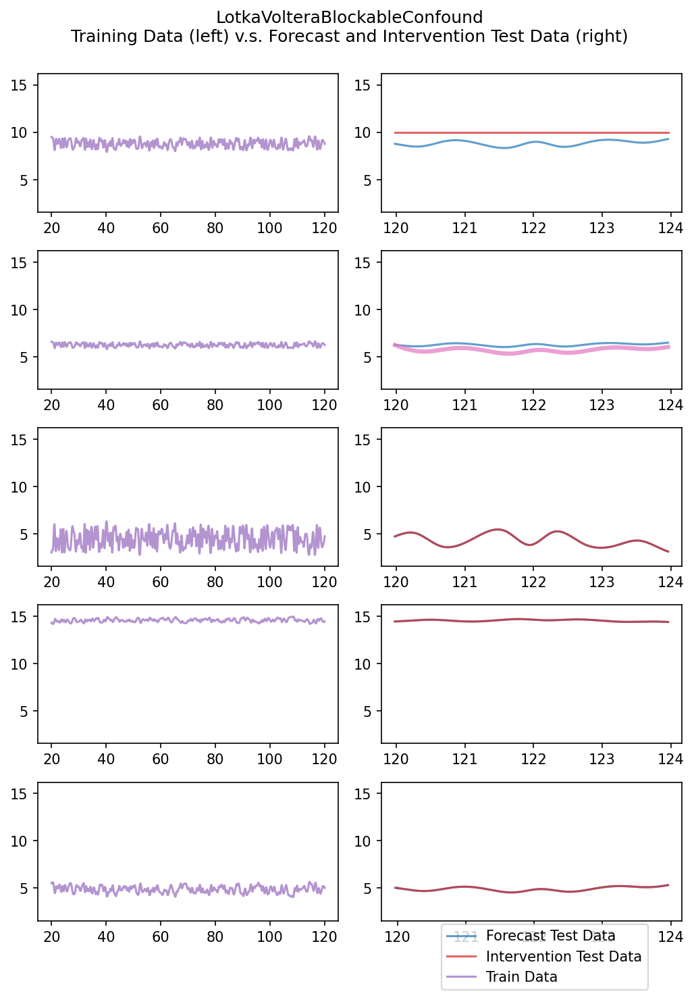

DATA GENERATOR NAME: 
	CoupledLogisticMapConfound

MODEL_TYPE: 
	interfere.dynamics.coupled_logistic_map

DOCUMENTATION FOR MODEL: 

Initializes an N-dimensional coupled logistic map model.
    
    A coupled map lattice where coupling is determined by the passed
    adjacency matrix and the map applied is the logistic map.

    x[n+1]_i = (1 - eps) * f(x[n]_i) + (eps / degree(i)) sum_j Aij f(x[n]_j)

    where f(x) = logistic_param * x * (1 - x).

    Args:
        adjacency_matrix (2D array): The adjacency matrix that defines the
            way the variables are coupled. The entry A[i, j] should contain
            the weight of the link from x_j to x_i.
        logistic_param (float): The logistic map weight parameter   
            r, where the map is f(x) = rx(1-x).
        eps (float): A parameter that controls the relative strenth of    
            coupling. High epsilon means greater connection to neighbors.
        sigma (float): The standard deviation of the additive gaussi

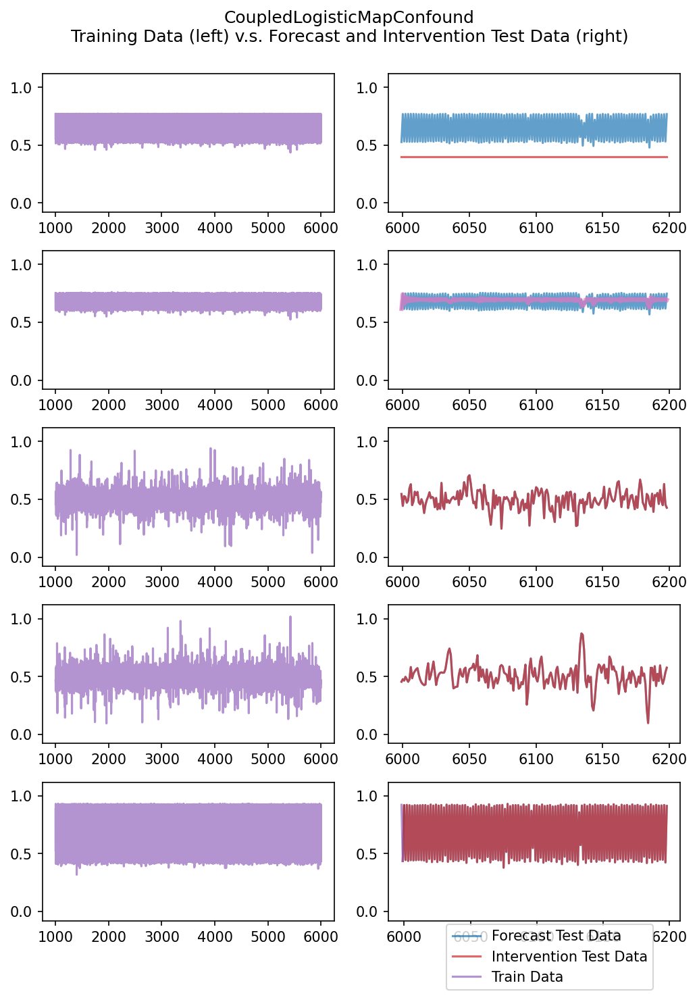

DATA GENERATOR NAME: 
	CoupledLogisticMapBlockableConfound

MODEL_TYPE: 
	interfere.dynamics.coupled_logistic_map

DOCUMENTATION FOR MODEL: 

Initializes an N-dimensional coupled logistic map model.
    
    A coupled map lattice where coupling is determined by the passed
    adjacency matrix and the map applied is the logistic map.

    x[n+1]_i = (1 - eps) * f(x[n]_i) + (eps / degree(i)) sum_j Aij f(x[n]_j)

    where f(x) = logistic_param * x * (1 - x).

    Args:
        adjacency_matrix (2D array): The adjacency matrix that defines the
            way the variables are coupled. The entry A[i, j] should contain
            the weight of the link from x_j to x_i.
        logistic_param (float): The logistic map weight parameter   
            r, where the map is f(x) = rx(1-x).
        eps (float): A parameter that controls the relative strenth of    
            coupling. High epsilon means greater connection to neighbors.
        sigma (float): The standard deviation of the additi

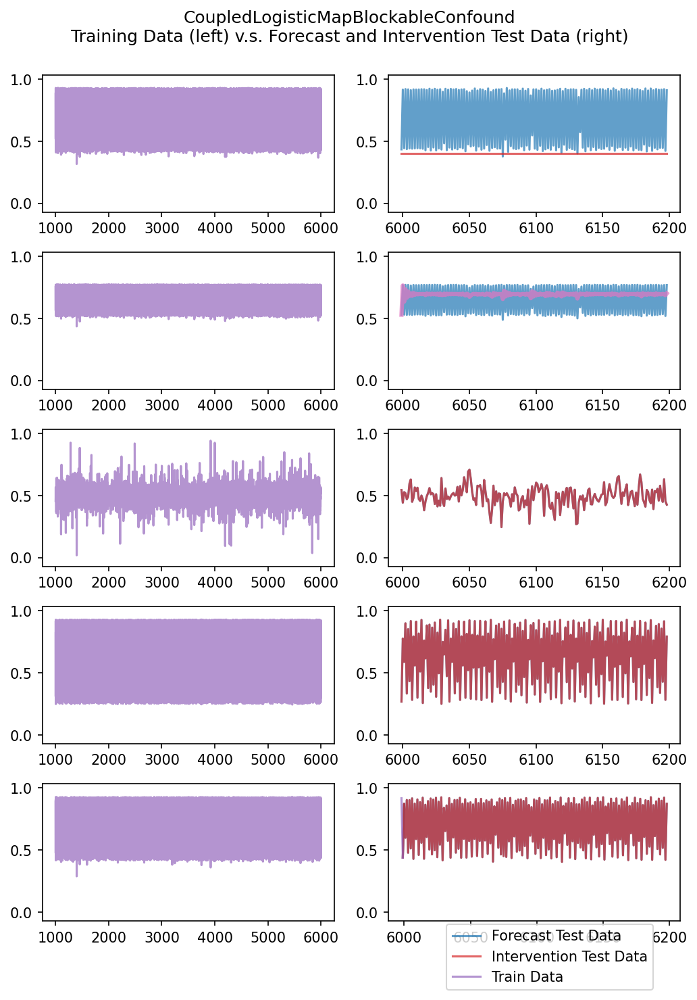

DATA GENERATOR NAME: 
	WilsonCowanDownstream

MODEL_TYPE: 
	interfere.dynamics.WilsonCowan

DOCUMENTATION FOR MODEL: 

Initializes a model.

        Description:
            Wilson–Cowan model. Here, the nodal state xi is the activity of 
            neuron i, and the parameters τ and μ are the slope and the threshold
            of the neural activation function. The link weight Aij specifies the
            number and strength of synapses from neuron j to neuron i.

            dxi/dt = -xi + ∑ Aij / (1 + exp(-τ (xj - µ)))

        Args:
            tau (float): The slope parameter.
            mu (float): The threshold parameter.
            adjacency_matrix (ndarray (n, n)): Adjacency matrix. Aij quantifies
                number and strength of synapses from neuron j to neuron i.
            measurement_noise_std (ndarray): None, or a vector with shape (n,)
                where each entry corresponds to the standard deviation of the
                measurement noise for that part

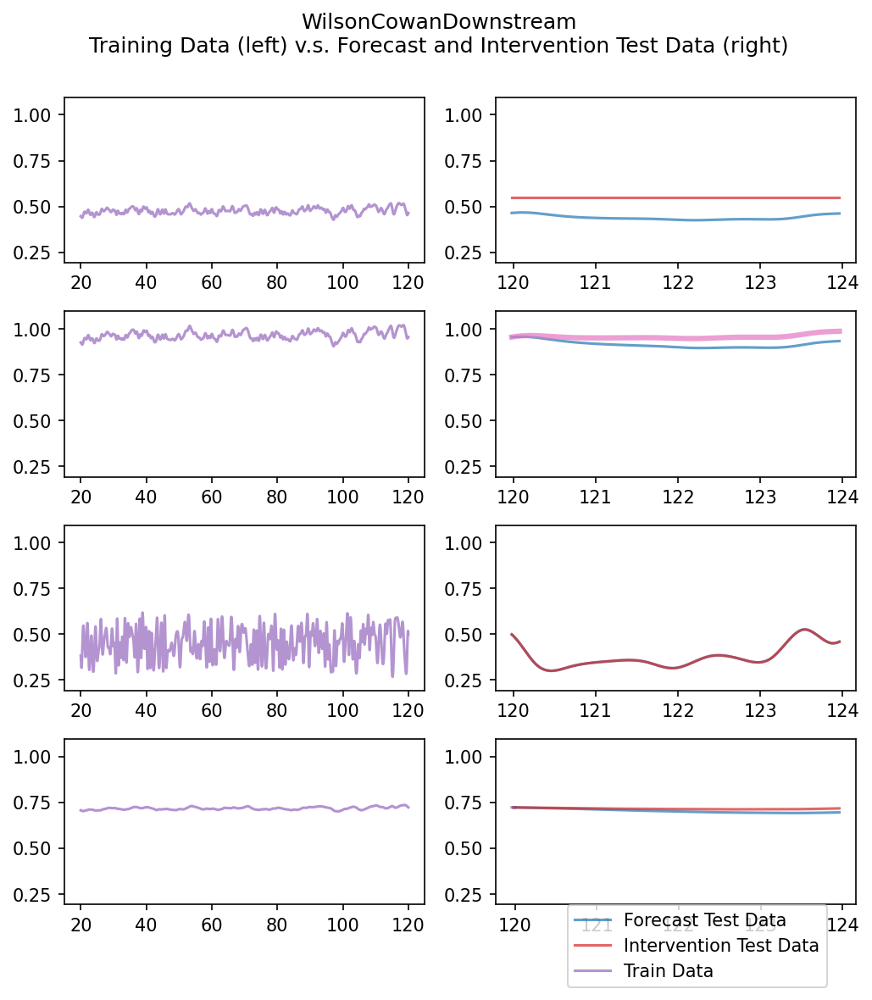

DATA GENERATOR NAME: 
	WilsonCowanMultiConf

MODEL_TYPE: 
	interfere.dynamics.WilsonCowan

DOCUMENTATION FOR MODEL: 

Initializes a model.

        Description:
            Wilson–Cowan model. Here, the nodal state xi is the activity of 
            neuron i, and the parameters τ and μ are the slope and the threshold
            of the neural activation function. The link weight Aij specifies the
            number and strength of synapses from neuron j to neuron i.

            dxi/dt = -xi + ∑ Aij / (1 + exp(-τ (xj - µ)))

        Args:
            tau (float): The slope parameter.
            mu (float): The threshold parameter.
            adjacency_matrix (ndarray (n, n)): Adjacency matrix. Aij quantifies
                number and strength of synapses from neuron j to neuron i.
            measurement_noise_std (ndarray): None, or a vector with shape (n,)
                where each entry corresponds to the standard deviation of the
                measurement noise for that parti

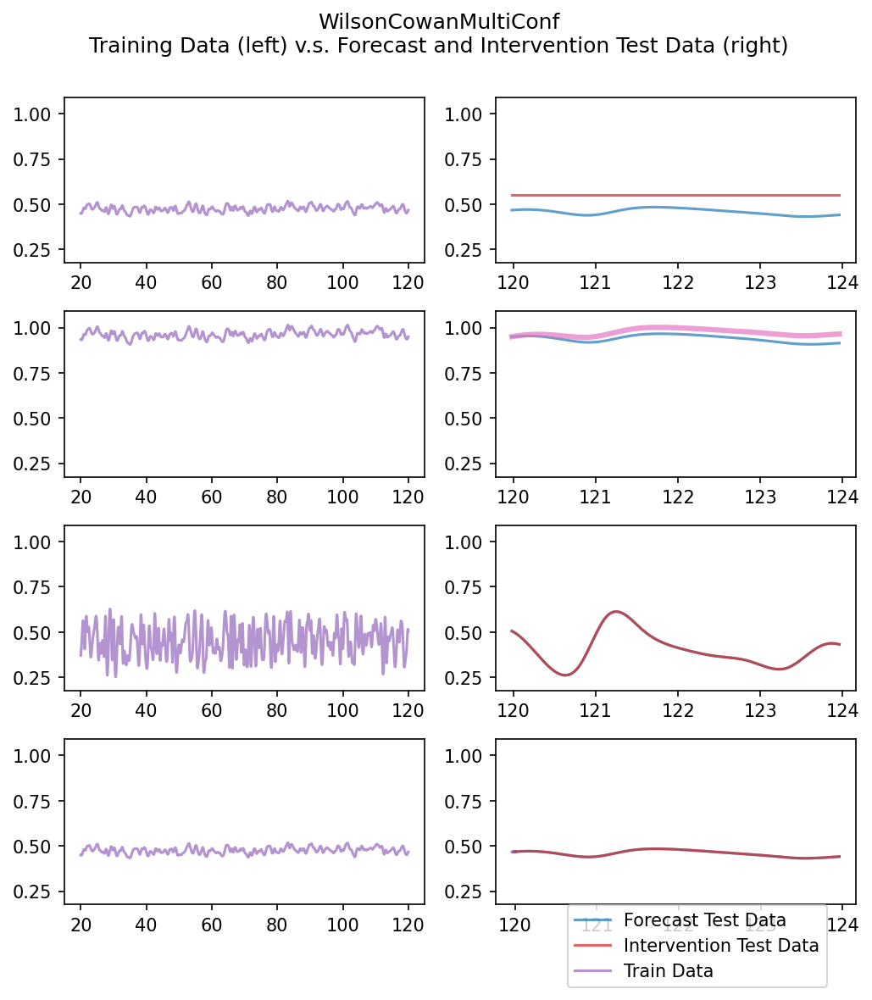

DATA GENERATOR NAME: 
	Lorenz1

MODEL_TYPE: 
	interfere.dynamics.Lorenz

DOCUMENTATION FOR MODEL: 

Initializes a 3D quadratic SDE.

        dx/dt = s * (y - x)

        dy/dy = x * (rho - z) - y

        dz/dt = x * y - beta * z

        This deterministic system is made stochastic by defining

        dx = [dx/dt, dy/dt, dz/dt]^T
        dW = [dw1, dw2, dw3]^T

        so that
        dX = dx * dt + sigma * dW

        where dW is an array of weiner incremements and sigma is a 3x3 matrix.

        
        Args:
            s (float): A parameter of the model.
            beta (float): A parameter of the model.
            rho (float): A parameter of the model.
            sigma (float or ndarray): The stochastic noise parameter. Can be a
                float, a 1D matrix or a 2D matrix. Dimension must match
                dimension of model.
            measurement_noise_std (ndarray): None, or a vector with shape (n,)
                where each entry corresponds to the standard d

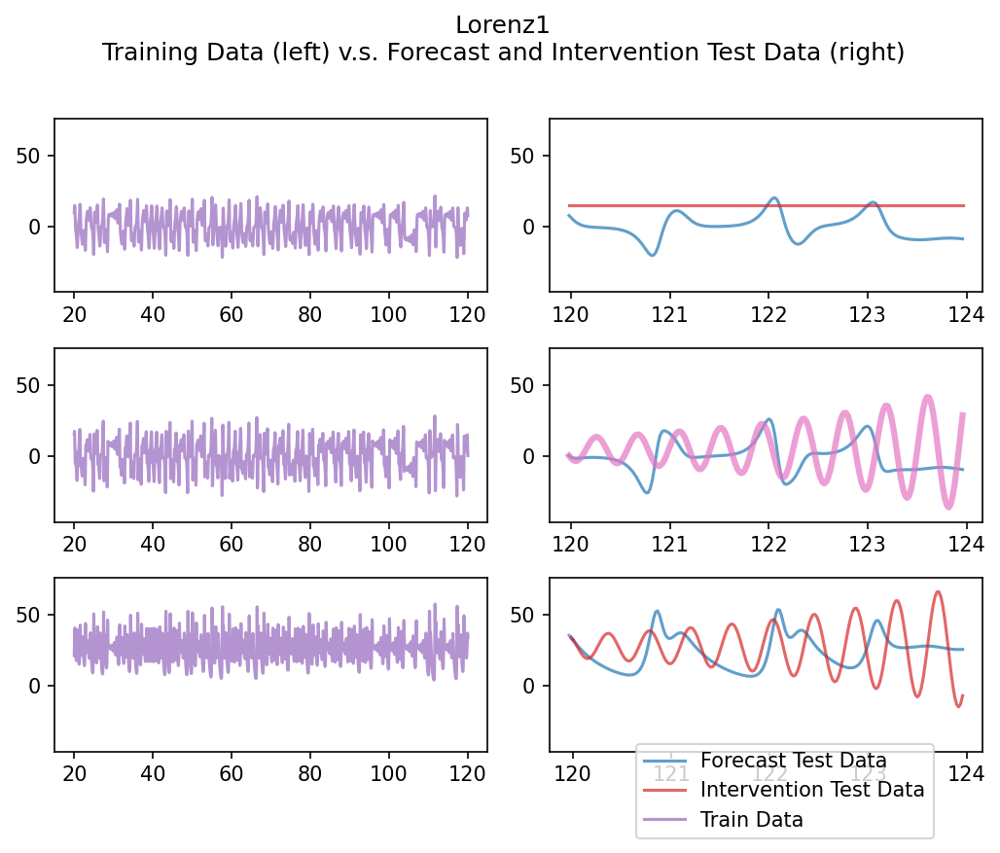

DATA GENERATOR NAME: 
	Lorenz2

MODEL_TYPE: 
	interfere.dynamics.Lorenz

DOCUMENTATION FOR MODEL: 

Initializes a 3D quadratic SDE.

        dx/dt = s * (y - x)

        dy/dy = x * (rho - z) - y

        dz/dt = x * y - beta * z

        This deterministic system is made stochastic by defining

        dx = [dx/dt, dy/dt, dz/dt]^T
        dW = [dw1, dw2, dw3]^T

        so that
        dX = dx * dt + sigma * dW

        where dW is an array of weiner incremements and sigma is a 3x3 matrix.

        
        Args:
            s (float): A parameter of the model.
            beta (float): A parameter of the model.
            rho (float): A parameter of the model.
            sigma (float or ndarray): The stochastic noise parameter. Can be a
                float, a 1D matrix or a 2D matrix. Dimension must match
                dimension of model.
            measurement_noise_std (ndarray): None, or a vector with shape (n,)
                where each entry corresponds to the standard d

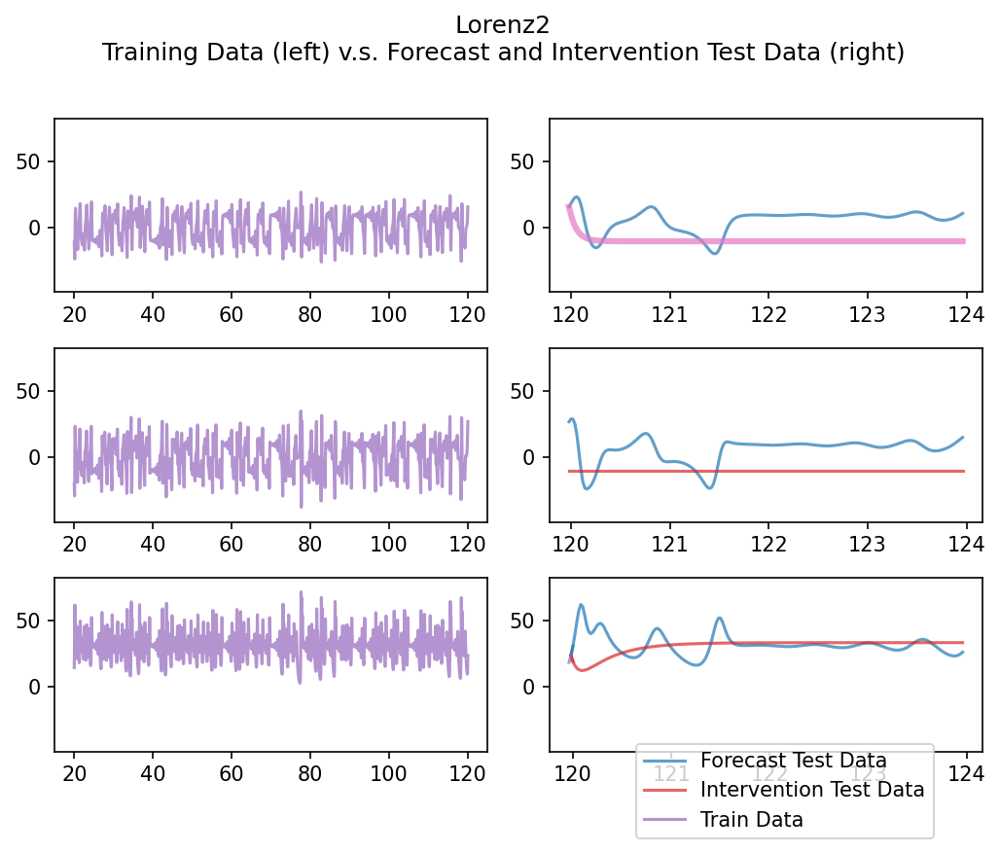

DATA GENERATOR NAME: 
	Rossler1

MODEL_TYPE: 
	interfere.dynamics.Rossler

DOCUMENTATION FOR MODEL: 

Initializes the Rossler system.

        dx/dt = - y - z

        dy/dy = x + a * y

        dz/dt = b + z * (x - c)

        This deterministic system is made stochastic by defining

        dx = [dx/dt, dy/dt, dz/dt]^T
        dW = [dw1, dw2, dw3]^T

        so that
        dX = dx * dt + sigma * dW

        where dW is an array of weiner incremements and sigma is a 3x3 matrix.

        Args:
            a (float): A parameter of the model.
            b (float): A parameter of the model.
            c (float): A parameter of the model.
            sigma (float or ndarray): The stochastic noise parameter. Can be a
                float, a 1D matrix or a 2D matrix. Dimension must match
                dimension of model.
            measurement_noise_std (ndarray): None, or a vector with shape (n,)
                where each entry corresponds to the standard deviation of the
         

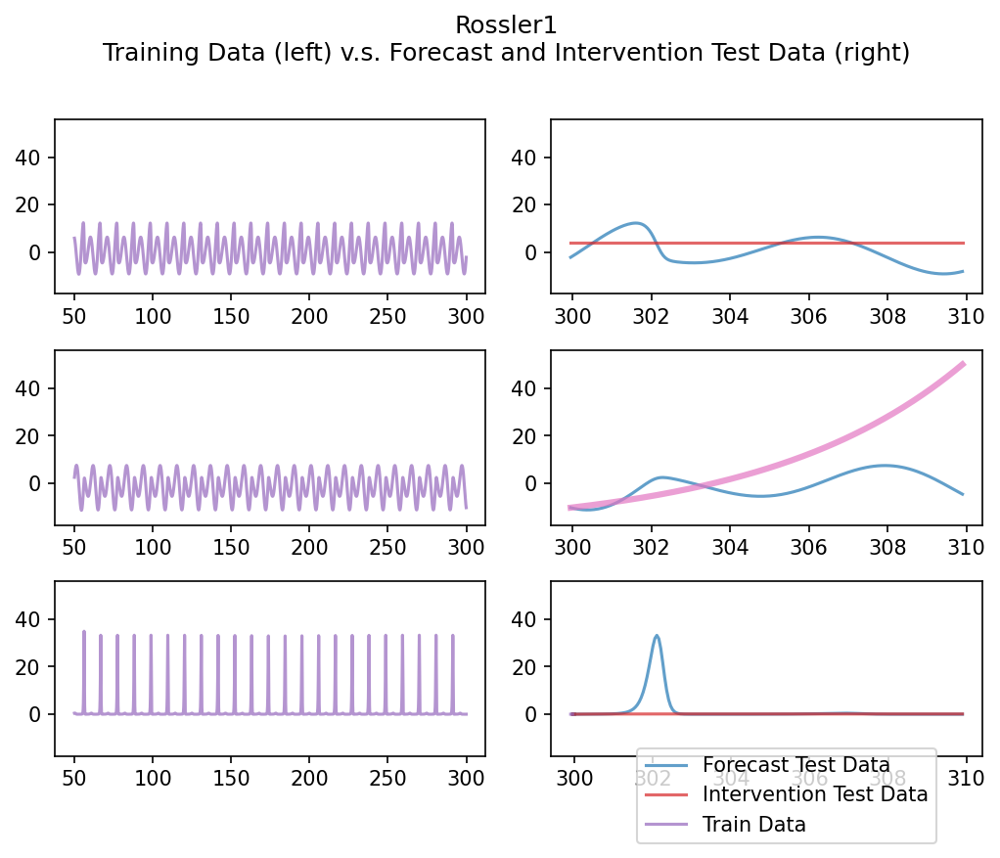

DATA GENERATOR NAME: 
	Rossler2

MODEL_TYPE: 
	interfere.dynamics.Rossler

DOCUMENTATION FOR MODEL: 

Initializes the Rossler system.

        dx/dt = - y - z

        dy/dy = x + a * y

        dz/dt = b + z * (x - c)

        This deterministic system is made stochastic by defining

        dx = [dx/dt, dy/dt, dz/dt]^T
        dW = [dw1, dw2, dw3]^T

        so that
        dX = dx * dt + sigma * dW

        where dW is an array of weiner incremements and sigma is a 3x3 matrix.

        Args:
            a (float): A parameter of the model.
            b (float): A parameter of the model.
            c (float): A parameter of the model.
            sigma (float or ndarray): The stochastic noise parameter. Can be a
                float, a 1D matrix or a 2D matrix. Dimension must match
                dimension of model.
            measurement_noise_std (ndarray): None, or a vector with shape (n,)
                where each entry corresponds to the standard deviation of the
         

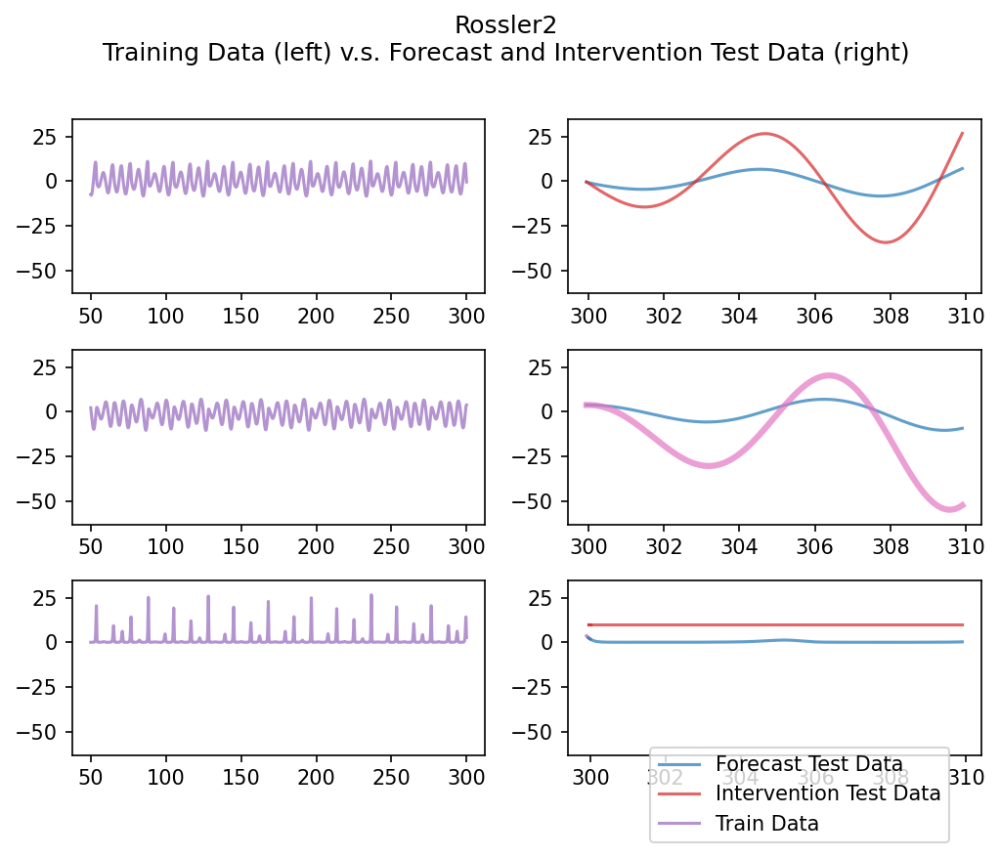

DATA GENERATOR NAME: 
	Thomas1

MODEL_TYPE: 
	interfere.dynamics.Thomas

DOCUMENTATION FOR MODEL: 

Initializes Thomas's cyclically symmetric attractor system.

        dx/dt = sin(y) - b * x

        dy/dy = sin(z) - b * y

        dz/dt = sin(x) - b * z

        This deterministic system is made stochastic by defining

        dx = [dx/dt, dy/dt, dz/dt]^T
        dW = [dw1, dw2, dw3]^T

        so that
        dX = dx * dt + sigma * dW

        where dW is an array of weiner incremements and sigma is a 3x3 matrix.

        Args:
            b (float): A parameter of the model corresponding to the amount of
                dissipation in the system. Chaotic for b <= 0.208186.
            sigma (float or ndarray): The stochastic noise parameter. Can be a
                float, a 1D matrix or a 2D matrix. Dimension must match
                dimension of model.
            measurement_noise_std (ndarray): None, or a vector with shape (n,)
                where each entry corresponds to 

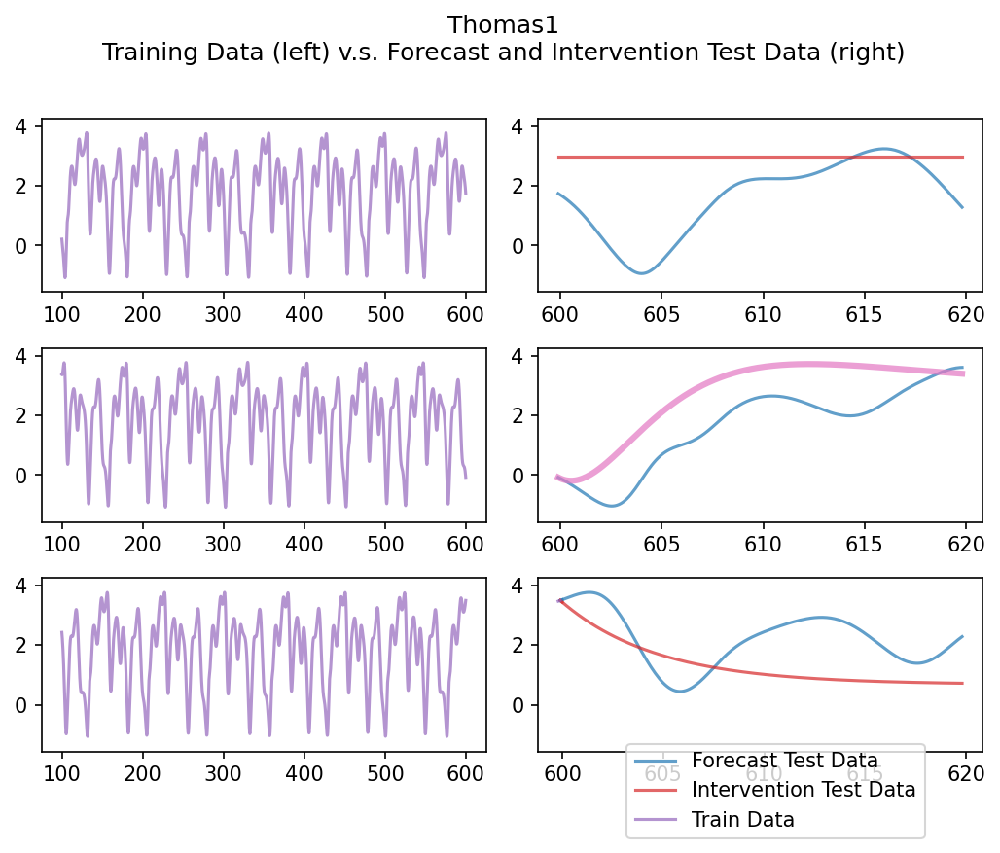

DATA GENERATOR NAME: 
	Thomas2

MODEL_TYPE: 
	interfere.dynamics.Thomas

DOCUMENTATION FOR MODEL: 

Initializes Thomas's cyclically symmetric attractor system.

        dx/dt = sin(y) - b * x

        dy/dy = sin(z) - b * y

        dz/dt = sin(x) - b * z

        This deterministic system is made stochastic by defining

        dx = [dx/dt, dy/dt, dz/dt]^T
        dW = [dw1, dw2, dw3]^T

        so that
        dX = dx * dt + sigma * dW

        where dW is an array of weiner incremements and sigma is a 3x3 matrix.

        Args:
            b (float): A parameter of the model corresponding to the amount of
                dissipation in the system. Chaotic for b <= 0.208186.
            sigma (float or ndarray): The stochastic noise parameter. Can be a
                float, a 1D matrix or a 2D matrix. Dimension must match
                dimension of model.
            measurement_noise_std (ndarray): None, or a vector with shape (n,)
                where each entry corresponds to 

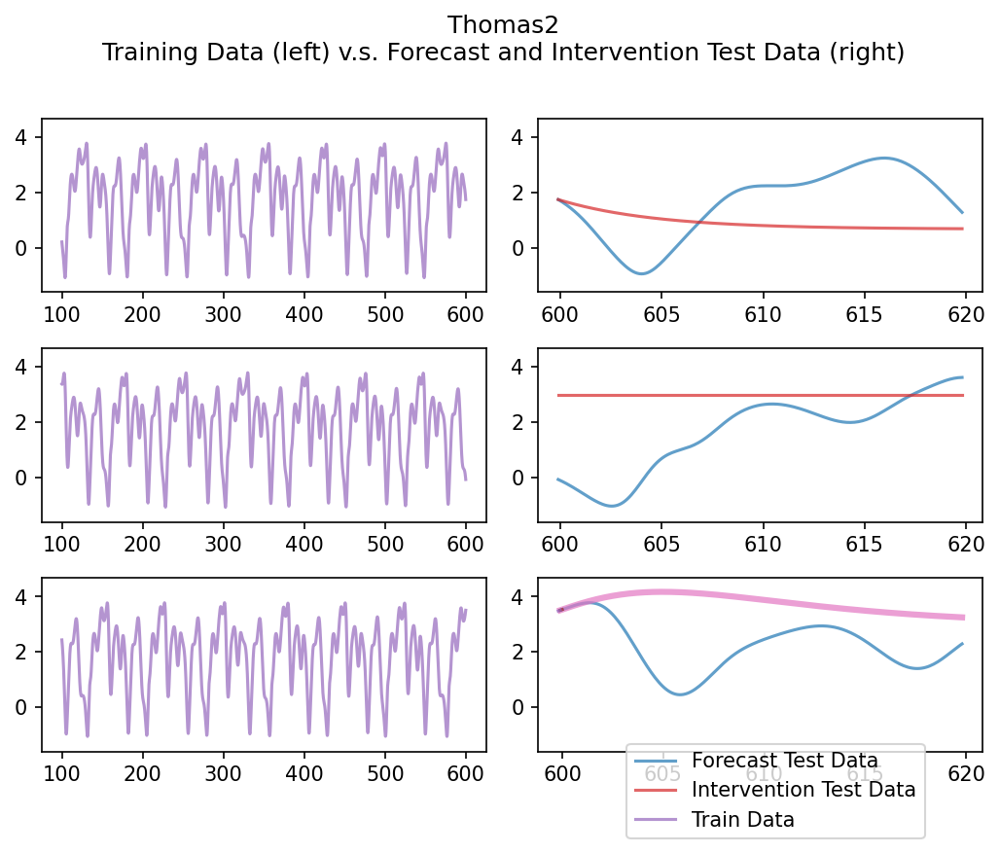

DATA GENERATOR NAME: 
	CoupledMapLatticeTravelingWave

MODEL_TYPE: 
	interfere.dynamics.coupled_map_1dlattice_traveling_wave

DOCUMENTATION FOR MODEL: 

Intitializes a specific parameterization of a CoupledMapLattice.

    Parameters taken from S2.3.1 of the supplimental material of
    Cliff et. al. 2023 "Unifying Pairwise..."

    The dynamics are governed by the following equation:

    x[n+1]_i = (1 - eps) * f(x[n]_i) + (eps / 2) * (f(x[n]_i+1) + f(x[n]_i-1))

    with:
        f(x) = 1 - alpha * x^2
        eps = 0.5
        alpha = 1.67
        and only observed every 2000 time steps.

    Args:
        dim (int): The number of nodes in the model.
        sigma (float): The standard deviation of the additive gaussian noise
            in the model.
        measurement_noise_std (ndarray): None, or a vector with shape (n,)
            where each entry corresponds to the standard deviation of the
            measurement noise for that particular dimension of the dynamic
           

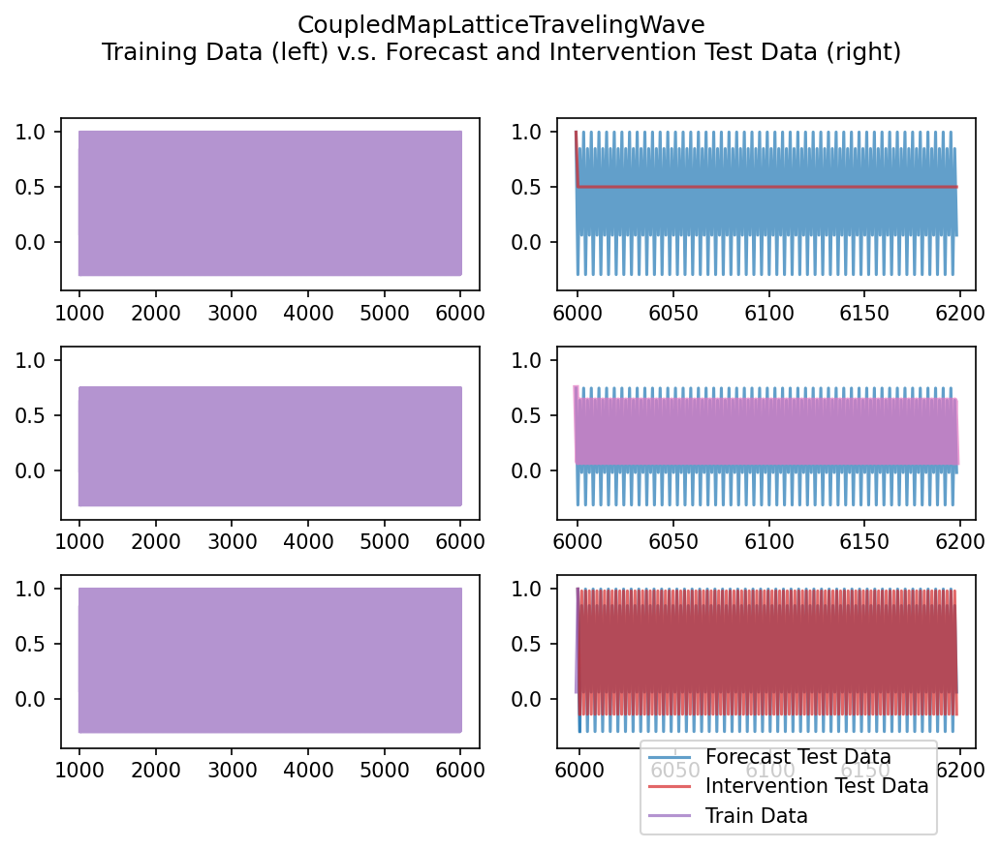

DATA GENERATOR NAME: 
	CoupledMapLatticeChaoticTravelingWave

MODEL_TYPE: 
	interfere.dynamics.coupled_map_1dlattice_chaotic_traveling_wave

DOCUMENTATION FOR MODEL: 

Intitializes a specific parameterization of a CoupledMapLattice.

    Parameters taken from S2.3.1 of the supplimental material of
    Cliff et. al. 2023 "Unifying Pairwise..."

    The dynamics are governed by the following equation:

    x[n+1]_i = (1 - eps) * f(x[n]_i) + (eps / 2) * (f(x[n]_i+1) + f(x[n]_i-1))

    with:
        f(x) = 1 - alpha * x^2
        eps = 0.5
        alpha = 1.69
        and only observed every 5000 time steps.

    Args:
        dim (int): The number of nodes in the model.
        sigma (float): The standard deviation of the additive gaussian noise
            in the model.
        measurement_noise_std (ndarray): None, or a vector with shape (n,)
            where each entry corresponds to the standard deviation of the
            measurement noise for that particular dimension of the dyna

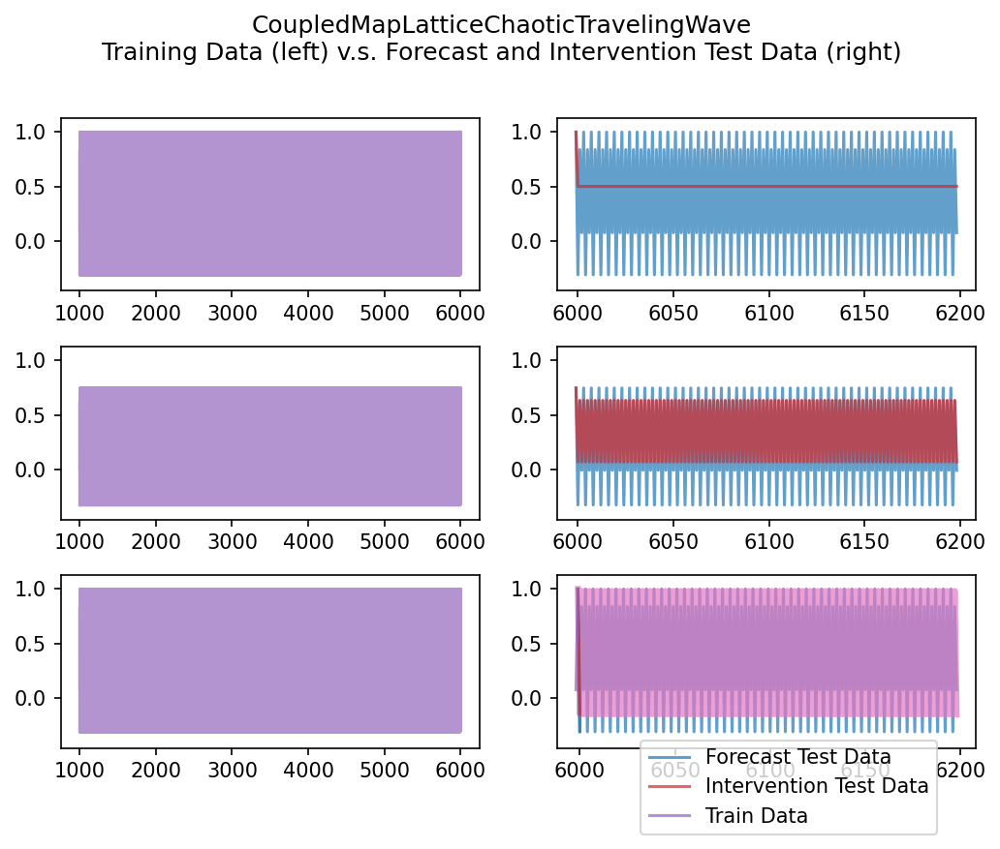

In [21]:

for data_generator in BENCHMARK_MODELS:
    dg = data_generator()

    data = dg.generate_data(
        TRAIN_OBS, FORECAST_OBS, NUM_BURN_IN_STATES)
    
    dg_name = f"DATA GENERATOR NAME: \n\t{type(dg).__name__}\n\n"
    model_type = f"MODEL_TYPE: \n\tinterfere.dynamics.{dg.model_type.__name__}\n\n"

    if isinstance(dg.model_type, type(interfere.DynamicModel)):
        init_descr = (
            f"DOCUMENTATION FOR MODEL: \n\n{dg.model_type.__init__.__doc__}\n\n"
        )
    else:
        init_descr = f"DOCUMENTATION FOR MODEL: \n\n{dg.model_type.__doc__}\n\n"

    param_str = "PARAMS:\n\n" + "\n".join(
        [
            f"{k} = {v}\n"
            for k, v in dg.model_params.items()
        ]
    )

    commit = "\n\nINTERFERE COMMIT:\n\npip install git+https://github.com/djpasseyjr/interfere.git@3e62534c294776c620dd57994a4b3ee864bd3c12"
    

    
    description = dg_name + model_type + init_descr + param_str
    print(description)

    data = dg.generate_data(5000, 200, num_burn_in_states=1000)
    plot_helper(type(dg).__name__, data, target_idx=dg.target_idx)

    # Save
    data.to_json(
        DATA_DIR + data_generator.__name__ + ".json",
        model_description=description
    )

In [28]:
UPDATE_DATA_DIR = "/Users/djpassey/Google Drive/My Drive/Docs/PhD Research/DissertationColabs/InterfereBenchmark1.0.1/"

# Add target variable index to the JSON files.

for data_generator in BENCHMARK_MODELS:
    with open(DATA_DIR + data_generator.__name__ + ".json", "r") as f:
        dg_json = json.load(f)

    dg_json["target_idx"] = data_generator.target_idx
    dg_json["metadata"]["variables"].append(
        {
            "name": "target_idx",
            "type": "int",
            "description": "An integer denoting the column index of the target prediction variable."
        },
    )

    with open(UPDATE_DATA_DIR + data_generator.__name__ + ".json", "w") as f:
        json.dump(dg_json, f)